In [1]:
import joblib
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix, precision_recall_curve, cohen_kappa_score
import os
import sys
import warnings 
from scipy.stats import mannwhitneyu
import seaborn as sns
import matplotlib.pyplot as plt 
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import numpy as np

sys.path.append(os.path.dirname(os.getcwd()))
from py_funcs.func_ml import *
from py_funcs.func_query_mimic import *
from py_funcs.func_project_dir import *

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)

warnings.simplefilter('ignore')
# Set a consistent style using seaborn
sns.set(style="darkgrid")

In [2]:
path = project_path()+r"/machine_learning/results"
list_results = os.listdir(path)

# Training-Process

In [3]:
df = pd.concat([pd.read_csv(path+"/"+i) for i in(os.listdir(path))])
df = df.drop(df.columns[0], axis=1)
df = df[df["pipeline"].str.contains("presel trained hour") == False]
df.reset_index(inplace=True, drop=True)

df["computation_time"] = df["computation_time"] / 60
df["test_accuracy_per_computation_time"] = df["test_accuracy"] / df["computation_time"]
models = []
for _, i in df.iterrows():
    if i["model"] not in models:
        models.append(i["model"])

df["model_shortname"] = df["model"].map(dict(zip(sorted(models), ["LR", "RF", "SVM", "Stack", "Stack", "Stack", "Stack", "XGB"])))
df["alias"] = df["pipeline"].map(dict(zip(sorted(df["pipeline"].unique()), ["ST","ST","ST","ST", "AF", "FH", "SP", "PF", "SL", "SLS"])))
df = df.sort_values(by=["pipeline", "model"], ascending=[False, True])
def group_count(group):
    group["alias"] = group["alias"] + [str(i) for i in range(1, len(group)+1, 1)]
    return group
df = df.groupby("alias").apply(group_count).reset_index(drop=True)
df["alias"] = df["model_shortname"] + " - " + df["alias"] 
df["pipeline_nr"] = [2, 2, 10, 10, 1, 1, 3, 3, 3, 3, 4, 4, 5, 8, 6, 9, 7]
df.index = df["alias"]

In [4]:
df[["alias","model", "pipeline", "pipeline_nr"]].reset_index(drop=True).sort_values(by=["pipeline", "model"], ascending=[False, True])

,alias,model,pipeline,pipeline_nr
8,LR - SLS1,LogisticRegression,"standard scaled, lasso alpha_search",3
6,LR - SL1,LogisticRegression,"standard scaled, lasso",3
7,SVM - SL2,SVM,"standard scaled, lasso",3
4,RF - PF1,RandomForest,preselected features,1
5,XGB - PF2,XGBClassifier,preselected features,1
9,LR - SP1,LogisticRegression,"pca, standard scaled",3
10,RF - SP2,RandomForest,"pca, standard scaled",4
11,SVM - SP3,SVM,"pca, standard scaled",4
12,XGB - SP4,XGBClassifier,"pca, standard scaled",5
2,RF - FH1,RandomForest,first_hour,10


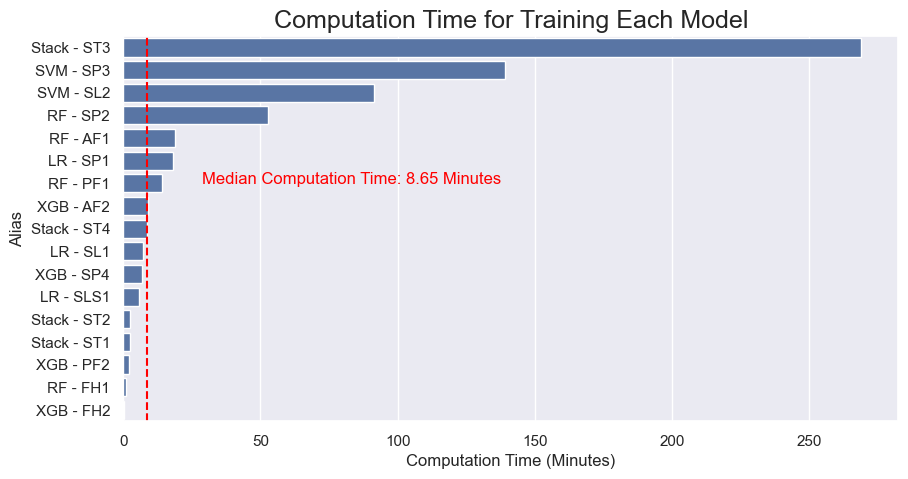

In [5]:
data = df.sort_values(by="computation_time", ascending=False)
plt.figure(figsize=(10,5))
plt.title("Computation Time for Training Each Model", fontsize=18)
sns.barplot(data=data, y="alias", x= "computation_time")
computetime_median = data["computation_time"].median()
plt.axvline(computetime_median, color="red", linestyle="--")
plt.annotate(f"Median Computation Time: {round(computetime_median,2)} Minutes", xy=(computetime_median+20,6), color="red")
plt.xlabel("Computation Time (Minutes)")
plt.ylabel("Alias")
plt.show()

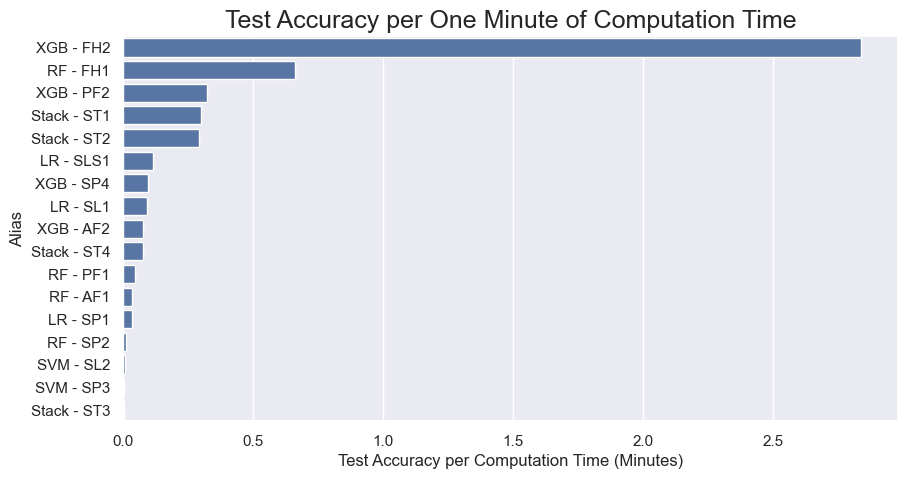

In [6]:
data = df.sort_values(by="test_accuracy_per_computation_time", ascending=False)
plt.figure(figsize=(10,5))
plt.title("Test Accuracy per One Minute of Computation Time", fontsize=18)
sns.barplot(data=data, y="alias", x= "test_accuracy_per_computation_time")
plt.xlabel("Test Accuracy per Computation Time (Minutes)")
plt.ylabel("Alias")
plt.show()

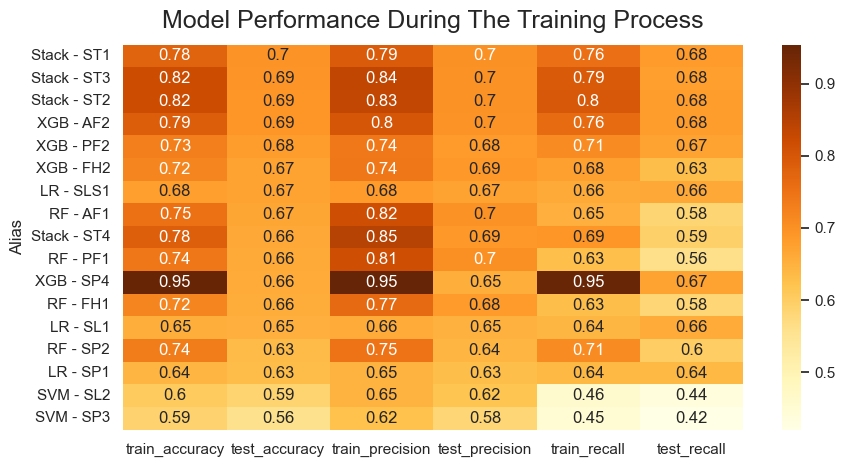

In [47]:
data = df.sort_values(by=["test_accuracy", "test_recall", "train_accuracy", "train_recall"], ascending=False)
plt.figure(figsize=(10,5))
plt.title("Model Performance During The Training Process", fontsize=18, pad=12)
sns.heatmap(data.iloc[:,2:8], cmap="YlOrBr", annot=True)
plt.ylabel("Alias")
plt.show()

In [8]:
models = {
    "Stack - ST4":"StackedRF.joblib",
    "Stack - ST1":"StackedXGB_LR.joblib",
    "Stack - ST2":"StackedXGB.joblib",
    "RF - PF1":"RandomForest_presel.joblib",
    "RF - AF1":"RandomForest_all.joblib",
    "RF - SP2":"RandomForest_pca.joblib",
    "XGB - PF2":"XGBClassifier_presel.joblib",
    "XGB - AF2":"XGBClassifier_all.joblib",
    "XGB - SP4":"XGBClassifier_pca.joblib",
    "SVM - SL2":"SVM_lasso_alpha_fix.joblib",
    "SVM - SP3":"SVM_pca.joblib",
    "LR - SL1":"LogisticRegression_lasso_alpha_fix.joblib",
    "LR - SLS1":"LogisticRegression_lasso_alpha_search.joblib",
    "LR - SP1":"LogisticRegression_pca.joblib",
    "Stack - ST3":"StackedRF_XGB.joblib",
    "RF - FH1":"RandomForest_first_hour.joblib",
    "XGB - FH2":"XGBClassifier_first_hour.joblib",
}

# Evaluation on Testdata

## ROC results on balanced data

In [9]:
df_train_ids    = pd.read_csv(project_path()+r"/machine_learning/df_train_ids.csv", index_col=0)
df_test_ids     = pd.read_csv(project_path()+r"/machine_learning/df_test_ids.csv", index_col=0)

df_rf_feature_selection = pd.read_csv(project_path()+r"/data/target_data/rf_feature_selection.csv", index_col=0)
df_ml                   = pd.read_csv(project_path()+r"/data/target_data/df_ml.csv", index_col=0)
df_ml                   = df_ml[(df_ml["SEPSIS_ONSET_HOUR"] >= 5) & (df_ml["MAX_HOUR"] >= 5)]

df_stjohn               = pd.read_csv(project_path()+r"/data/target_data/df_stjohn_flag.csv", index_col=0)

In [10]:

results_bal = {
    "method": [],
    "model": [],
    "hour_before_so": [],
    "accuracy": [],
    "recall": [],
    "precision": [],
    "f1": [],
    "roc_auc": [],
    "pr_auc":[]
}

pred_bal = {
    "method": [],
    "model": [],
    "hour_before_so": [],
    "y_true": [],
    "y_pred": []
}

curves_ml_bal = {}

# Load Models
for key in models:
    model = joblib.load(project_path()+fr"/machine_learning/models/{models[key]}")
    
    # Feature-Handling
    if hasattr(model, "feature_names_in_"):
        features = model.feature_names_in_
    else:
        features = df_ml.columns[10:]

    cols = df_ml.loc[:, features].columns
    
    df_ml_test = df_ml.merge(df_test_ids, on=["SEPSIS_ID", "RANDOM_NO_SEPSIS_ID"])
    meta = df_ml_test.iloc[:, :10]
    X_test = df_ml_test.loc[:, cols]
    y_pred_proba = model.predict_proba(X_test)
    df_pred = pd.concat([meta.reset_index(drop=True), pd.DataFrame(y_pred_proba).reset_index(drop=True)], axis=1)
    

    for hour in range(1, 13):
        for method in ["row_wise", "icu_stay_wise"]:
            if method == "row_wise":
                row_wise = df_pred[(df_pred["HOUR"] < df_pred["SEPSIS_ONSET_HOUR"] - hour) & 
                                   (df_pred["HOUR"] + (hour + 1) >= df_pred["SEPSIS_ONSET_HOUR"])]
                y_pred = np.where(row_wise[1] >= 0.5, 1, 0).tolist()
                y_score = row_wise[1].to_list()
                y_true = row_wise["SEPSIS_LABEL"].to_list()
            elif method == "icu_stay_wise":
                icu_stay_wise = df_pred[(df_pred["HOUR"] < df_pred["SEPSIS_ONSET_HOUR"] - hour)].groupby("ICUSTAY_ID").tail(4).reset_index(drop=True)
                y_pred = np.where(icu_stay_wise.groupby("ICUSTAY_ID")[1].mean() >= 0.5, 1, 0).tolist()
                y_score = icu_stay_wise.groupby("ICUSTAY_ID")[1].mean().to_list()
                y_true = icu_stay_wise.groupby("ICUSTAY_ID")["SEPSIS_LABEL"].max().to_list()

            # Caluclate Metrics
            accuracy = accuracy_score(y_true, y_pred)
            recall = recall_score(y_true, y_pred)
            precision = precision_score(y_true, y_pred)
            f1 = f1_score(y_true, y_pred)

            # Add results to results_bal
            results_bal["method"].append(method)
            results_bal["model"].append(key)
            results_bal["hour_before_so"].append(hour)
            results_bal["accuracy"].append(accuracy)
            results_bal["recall"].append(recall)
            results_bal["precision"].append(precision)
            results_bal["f1"].append(f1)

            # Save predictions in pred_bal
            pred_bal["method"].append(method)
            pred_bal["model"].append(key)
            pred_bal["hour_before_so"].append(hour)
            pred_bal["y_true"].append(y_true)
            pred_bal["y_pred"].append(y_pred)

            # Calculation of ROC AUC
            fpr, tpr, _ = roc_curve(y_true, y_score)
            roc_auc_value = auc(fpr, tpr)
            results_bal["roc_auc"].append(roc_auc_value)

            # Calculate PR curve
            precision_vals, recall_vals, _ = precision_recall_curve(y_true, y_score)
            pr_auc = auc(recall_vals, precision_vals)
            results_bal["pr_auc"].append(pr_auc)
            # Save ROC and PR data in curves_ml_bal
            if method not in curves_ml_bal:
                curves_ml_bal[method] = {}
            if hour not in curves_ml_bal[method]:
                curves_ml_bal[method][hour] = {}
            if key not in curves_ml_bal[method][hour]:
                curves_ml_bal[method][hour][key] = {}
            
            curves_ml_bal[method][hour][key] = {
                "tpr": tpr,
                "fpr": fpr,
                "roc_auc": roc_auc_value,
                "precision": precision_vals,
                "recall": recall_vals,
                "pr_auc": pr_auc
            }

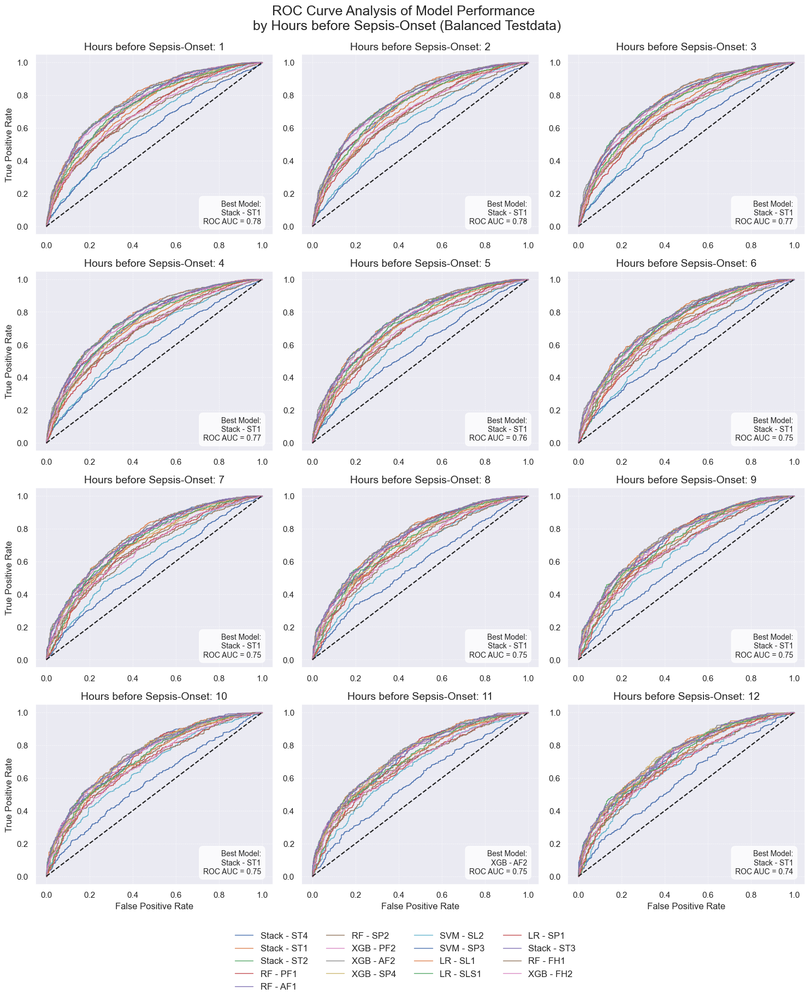

In [11]:
palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}

num_hours = 12
rows = 4
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(15, 18))
axes = axes.flatten()
plt.suptitle("ROC Curve Analysis of Model Performance \n by Hours before Sepsis-Onset (Balanced Testdata)", fontsize=18)

for i, (hour, keys_dict) in enumerate(curves_ml_bal["icu_stay_wise"].items()):
    best_auc = 0  # Initialize the best AUC value for this hour
    best_model = ''  # Model name with the best AUC value

    for k, (key, model) in enumerate(keys_dict.items()):
        tpr = model["tpr"]
        fpr = model["fpr"]
        auc_value = model["roc_auc"]  # Assuming roc_auc is already in the data

        if auc_value > best_auc:
            best_auc = auc_value
            best_model = key

        # Plot the ROC curve without AUC in the legend
        axes[i].plot(fpr, tpr, label=key, linewidth=1)

    # Plot the diagonal line
    axes[i].plot([0, 1], [0, 1], 'k--', linewidth=1.5)

    # Add the best AUC value as an annotation in a box
    annotation_text = f"Best Model:\n{best_model}\nROC AUC = {best_auc:.2f}"
    axes[i].text(0.95, 0.05, annotation_text,
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=axes[i].transAxes,
                 bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                 fontsize=10)

    # Add titles back to each subplot
    axes[i].set_title(f"Hours before Sepsis-Onset: {hour}", fontsize=14)

    # Format only the outer axes with labels
    if i % cols == 0:  # Leftmost column
        axes[i].set_ylabel('True Positive Rate', fontsize=12)
    if i >= len(axes) - cols:  # Bottom row
        axes[i].set_xlabel('False Positive Rate', fontsize=12)

    axes[i].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Adjust the spacing between subplots
plt.tight_layout(rect=[0, 0.05, 1, 1])

# Adding a legend below the plots with padding
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.03), frameon=False)

plt.subplots_adjust(top=0.93) 
# Show the plot
plt.show()


## PR-Cure results on balanced data

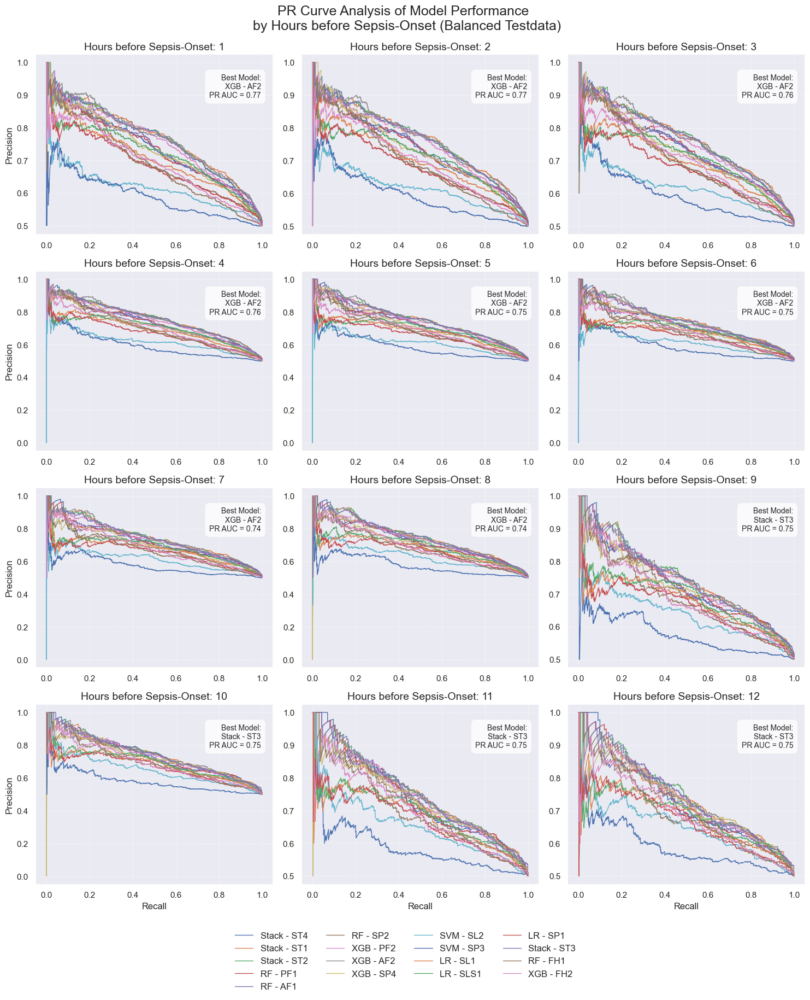

In [12]:
palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}


num_hours = 12
rows = 4
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(15, 18))
axes = axes.flatten()

plt.suptitle("PR Curve Analysis of Model Performance \n by Hours before Sepsis-Onset (Balanced Testdata)", fontsize=18)

for i, (hour, keys_dict) in enumerate(curves_ml_bal["icu_stay_wise"].items()):
    best_auc = 0  # Initialize the best PR AUC value for this hour
    best_model = ''  # Model name with the best PR AUC value

    for k, (key, model) in enumerate(keys_dict.items()):
        precision = model["precision"]
        recall = model["recall"]
        pr_auc = model["pr_auc"]  # Assuming pr_auc is already in the data

        if pr_auc > best_auc:
            best_auc = pr_auc
            best_model = key

        # Plot the PR curve without AUC in the legend
        axes[i].plot(recall, precision, label=key, linewidth=1)

    # Add the best PR AUC value as an annotation in a box
    annotation_text = f"Best Model:\n{best_model}\nPR AUC = {best_auc:.2f}"
    axes[i].text(0.95, 0.75, annotation_text,
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=axes[i].transAxes,
                 bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                 fontsize=10)

    # Add titles back to each subplot
    axes[i].set_title(f"Hours before Sepsis-Onset: {hour}", fontsize=14)

    # Format only the outer axes with labels
    if i % cols == 0:  # Leftmost column
        axes[i].set_ylabel('Precision', fontsize=12)
    if i >= len(axes) - cols:  # Bottom row
        axes[i].set_xlabel('Recall', fontsize=12)

    axes[i].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Adjust the spacing between subplots
plt.tight_layout(rect=[0, 0.05, 1, 1])

# Adding a legend below the plots with padding
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.03), frameon=False)
plt.subplots_adjust(top=0.93) 
# Show the plot
plt.show()

In [13]:
df_stjohn = df_ml.iloc[:,:10].merge(df_stjohn).merge(df_test_ids, on=["SEPSIS_ID", "RANDOM_NO_SEPSIS_ID"])
df_stjohn["ANY_SEPSIS_ALERT"] = np.where((df_stjohn["SEPSIS_ALERT"] == 1) | (df_stjohn["SEVERE_SEPSIS_ALERT"] == 1), 1, 0)

results_stjohn_icustay_bal = {
    "method":[],
    "model":[],
    "hour_before_so":[],
    "accuracy":[],
    "recall":[],
    "precision":[],
    "f1":[],
    "roc_auc":[],
    "pr_auc":[]
}

pred_ml_stjohn_icustay_bal = {
    "method":[],
    "model":[],
    "hour_before_so":[],
    "y_true":[],
    "y_pred":[]
}

for hour in range(1,13):
    df_result   = df_stjohn[df_stjohn["HOUR"] < df_stjohn["SEPSIS_ONSET_HOUR"] - hour]
    df_result   = df_result.groupby("ICUSTAY_ID").tail(4)
    df_result   = df_result.groupby("ICUSTAY_ID")[["SEPSIS_LABEL", "ANY_SEPSIS_ALERT"]].max().reset_index()

    accuracy            = accuracy_score(df_result["SEPSIS_LABEL"], df_result["ANY_SEPSIS_ALERT"])
    recall              = recall_score(df_result["SEPSIS_LABEL"], df_result["ANY_SEPSIS_ALERT"])
    precision           = precision_score(df_result["SEPSIS_LABEL"], df_result["ANY_SEPSIS_ALERT"]) 
    f1                  = f1_score(df_result["SEPSIS_LABEL"], df_result["ANY_SEPSIS_ALERT"]) 

    results_stjohn_icustay_bal["method"].append(None)
    results_stjohn_icustay_bal["model"].append("STJOHN")
    results_stjohn_icustay_bal["hour_before_so"].append(hour)
    results_stjohn_icustay_bal["accuracy"].append(accuracy)
    results_stjohn_icustay_bal["recall"].append(recall)
    results_stjohn_icustay_bal["precision"].append(precision)
    results_stjohn_icustay_bal["f1"].append(f1)
    results_stjohn_icustay_bal["roc_auc"].append(None)
    results_stjohn_icustay_bal["pr_auc"].append(None)

    pred_ml_stjohn_icustay_bal["method"].append("icu_stay_wise")
    pred_ml_stjohn_icustay_bal["model"].append("STJOHN")
    pred_ml_stjohn_icustay_bal["hour_before_so"].append(hour)
    pred_ml_stjohn_icustay_bal["y_true"].append(df_result["SEPSIS_LABEL"].tolist())
    pred_ml_stjohn_icustay_bal["y_pred"].append(df_result["ANY_SEPSIS_ALERT"].tolist())

## ROC results unbalanced data

In [14]:
df_train_ids    = pd.read_csv(project_path()+r"/machine_learning/df_train_ids.csv", index_col=0)
df_test_ids     = pd.read_csv(project_path()+r"/machine_learning/df_test_ids.csv", index_col=0)

df_rf_feature_selection = pd.read_csv(project_path()+r"/data/target_data/rf_feature_selection.csv", index_col=0)
df_ml                   = pd.read_csv(project_path()+r"/data/target_data/df_ml_testing.csv", index_col=0)
df_ml                   = df_ml[(df_ml["SEPSIS_ONSET_HOUR"] >= 5) & (df_ml["MAX_HOUR"] >= 5)]

df_stjohn               = pd.read_csv(project_path()+r"/data/target_data/df_stjohn_flag.csv", index_col=0)

In [15]:

results_unbal = {
    "method": [],
    "model": [],
    "hour_before_so": [],
    "accuracy": [],
    "recall": [],
    "precision": [],
    "f1": [],
    "roc_auc": [],
    "pr_auc":[]
}

pred_unbal = {
    "method": [],
    "model": [],
    "hour_before_so": [],
    "y_true": [],
    "y_pred": []
}

curves_ml_unbal = {}

# Load Models
for key in models:
    model = joblib.load(project_path() + fr"/machine_learning/models/{models[key]}")
    
    # Feature-Handling
    if hasattr(model, "feature_names_in_"):
        features = model.feature_names_in_
    else:
        features = df_ml.columns[10:]

    cols = df_ml.loc[:, features].columns
    
    df_ml_test = df_ml[df_ml["ICUSTAY_ID"].isin(df_train_ids.stack().reset_index()[0]) == False]
    meta = df_ml_test.iloc[:, :10]
    X_test = df_ml_test.loc[:, cols]
    y_pred_proba = model.predict_proba(X_test)
    df_pred = pd.concat([meta.reset_index(drop=True), pd.DataFrame(y_pred_proba).reset_index(drop=True)], axis=1)
    
    for hour in range(1, 13):
        for method in ["row_wise", "icu_stay_wise"]:
            if method == "row_wise":
                row_wise = df_pred[(df_pred["HOUR"] < df_pred["SEPSIS_ONSET_HOUR"] - hour) & 
                                   (df_pred["HOUR"] + (hour + 1) >= df_pred["SEPSIS_ONSET_HOUR"])]
                y_pred = np.where(row_wise[1] >= 0.5, 1, 0).tolist()
                y_score = row_wise[1].to_list()
                y_true = row_wise["SEPSIS_LABEL"].to_list()
            elif method == "icu_stay_wise":
                icu_stay_wise = df_pred[(df_pred["HOUR"] < df_pred["SEPSIS_ONSET_HOUR"] - hour)].groupby("ICUSTAY_ID").tail(4).reset_index(drop=True)
                y_pred = np.where(icu_stay_wise.groupby("ICUSTAY_ID")[1].mean() >= 0.5, 1, 0)
                y_score = icu_stay_wise.groupby("ICUSTAY_ID")[1].mean().to_list()
                y_true = icu_stay_wise.groupby("ICUSTAY_ID")["SEPSIS_LABEL"].max().to_list()

            # Caluclate Metrics
            accuracy = accuracy_score(y_true, y_pred)
            recall = recall_score(y_true, y_pred)
            precision = precision_score(y_true, y_pred)
            f1 = f1_score(y_true, y_pred)

            # Add results to results_bal
            results_unbal["method"].append(method)
            results_unbal["model"].append(key)
            results_unbal["hour_before_so"].append(hour)
            results_unbal["accuracy"].append(accuracy)
            results_unbal["recall"].append(recall)
            results_unbal["precision"].append(precision)
            results_unbal["f1"].append(f1)

            # Save predictions in pred_bal
            pred_unbal["method"].append(method)
            pred_unbal["model"].append(key)
            pred_unbal["hour_before_so"].append(hour)
            pred_unbal["y_true"].append(y_true)
            pred_unbal["y_pred"].append(y_pred)

            # Calculation of ROC AUC
            fpr, tpr, _ = roc_curve(y_true, y_score)
            roc_auc_value = auc(fpr, tpr)
            results_unbal["roc_auc"].append(roc_auc_value)

            # Calculate PR curve
            precision_vals, recall_vals, _ = precision_recall_curve(y_true, y_score)
            pr_auc = auc(recall_vals, precision_vals)
            results_unbal["pr_auc"].append(pr_auc)
            # Save ROC and PR data in curves_ml_bal
            if method not in curves_ml_unbal:
                curves_ml_unbal[method] = {}
            if hour not in curves_ml_unbal[method]:
                curves_ml_unbal[method][hour] = {}
            if key not in curves_ml_unbal[method][hour]:
                curves_ml_unbal[method][hour][key] = {}
            
            curves_ml_unbal[method][hour][key] = {
                "tpr": tpr,
                "fpr": fpr,
                "roc_auc": roc_auc_value,
                "precision": precision_vals,
                "recall": recall_vals,
                "pr_auc": pr_auc
            }

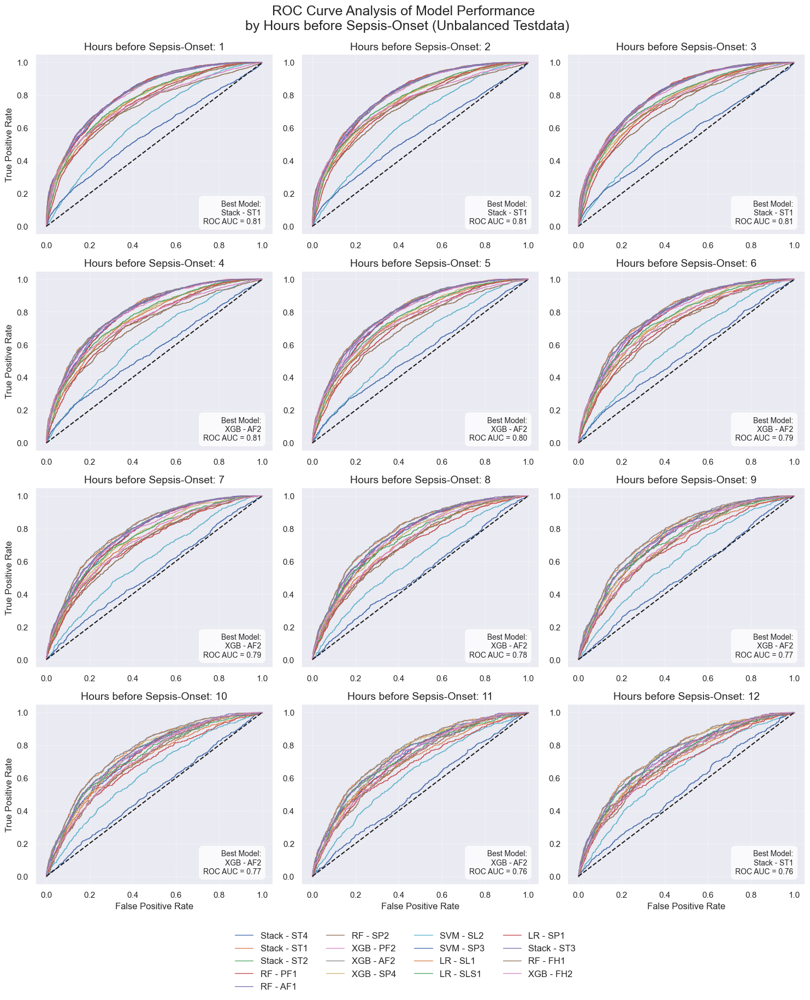

In [16]:
palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}

num_hours = 12
rows = 4
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(15, 18))
axes = axes.flatten()

plt.suptitle("ROC Curve Analysis of Model Performance \n by Hours before Sepsis-Onset (Unbalanced Testdata)", fontsize=18)


for i, (hour, keys_dict) in enumerate(curves_ml_unbal["icu_stay_wise"].items()):
    best_auc = 0  # Initialize the best AUC value for this hour
    best_model = ''  # Model name with the best AUC value

    for k, (key, model) in enumerate(keys_dict.items()):
        tpr = model["tpr"]
        fpr = model["fpr"]
        auc_value = model["roc_auc"] 

        if auc_value > best_auc:
            best_auc = auc_value
            best_model = key

        # Plot the ROC curve without AUC in the legend
        axes[i].plot(fpr, tpr, label=key, linewidth=1)

    # Plot the diagonal line
    axes[i].plot([0, 1], [0, 1], 'k--', linewidth=1.5)

    # Add the best AUC value as an annotation in a box
    annotation_text = f"Best Model:\n{best_model}\nROC AUC = {best_auc:.2f}"
    axes[i].text(0.95, 0.05, annotation_text,
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=axes[i].transAxes,
                 bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                 fontsize=10)

    # Add titles back to each subplot
    axes[i].set_title(f"Hours before Sepsis-Onset: {hour}", fontsize=14)

    # Format only the outer axes with labels
    if i % cols == 0:  # Leftmost column
        axes[i].set_ylabel('True Positive Rate', fontsize=12)
    if i >= len(axes) - cols:  # Bottom row
        axes[i].set_xlabel('False Positive Rate', fontsize=12)

    axes[i].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Adjust the spacing between subplots
plt.tight_layout(rect=[0, 0.05, 1, 1])

# Adding a legend below the plots with padding
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.03), frameon=False)

plt.subplots_adjust(top=0.93) 
# Show the plot
plt.show()

## PR-Curve results unbalanced data

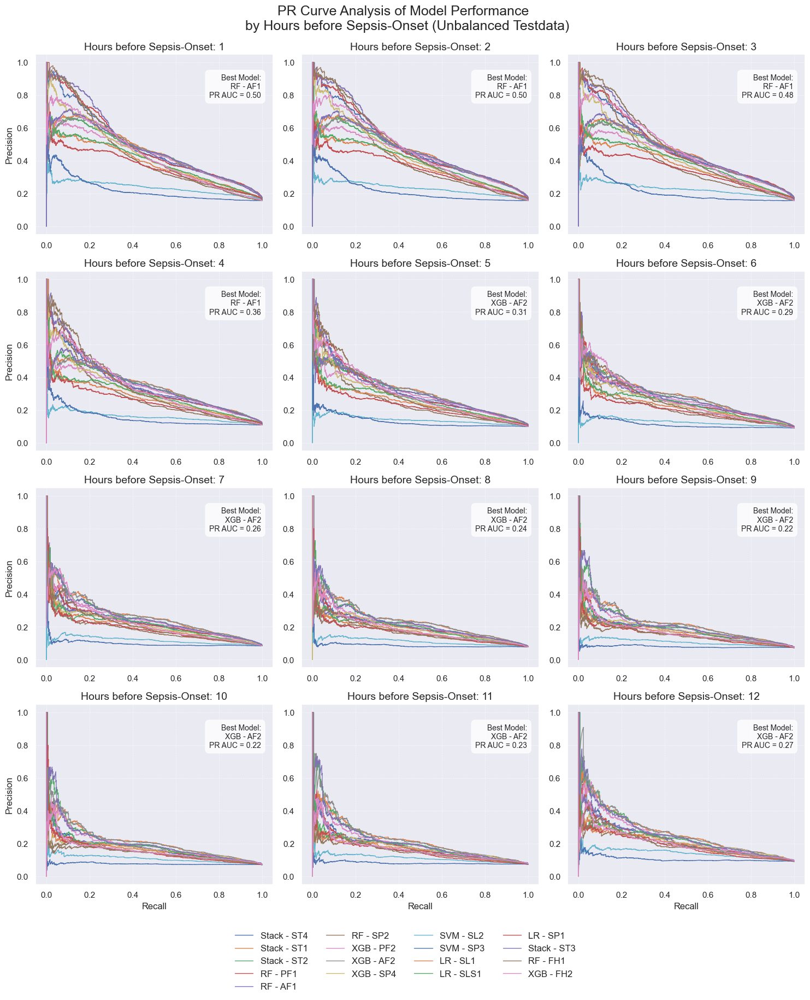

In [17]:
palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}

num_hours = 12
rows = 4
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(15, 18))
axes = axes.flatten()

plt.suptitle("PR Curve Analysis of Model Performance \n by Hours before Sepsis-Onset (Unbalanced Testdata)", fontsize=18)

for i, (hour, keys_dict) in enumerate(curves_ml_unbal["icu_stay_wise"].items()):
    best_auc = 0  # Initialize the best PR AUC value for this hour
    best_model = ''  # Model name with the best PR AUC value

    for k, (key, model) in enumerate(keys_dict.items()):
        precision = model["precision"]
        recall = model["recall"]
        pr_auc = model["pr_auc"]  # Assuming pr_auc is already in the data

        if pr_auc > best_auc:
            best_auc = pr_auc
            best_model = key

        # Plot the PR curve without AUC in the legend
        axes[i].plot(recall, precision, label=key, linewidth=1)

    # Add the best PR AUC value as an annotation in a box
    annotation_text = f"Best Model:\n{best_model}\nPR AUC = {best_auc:.2f}"
    axes[i].text(0.95, 0.75, annotation_text,
                 verticalalignment='bottom', horizontalalignment='right',
                 transform=axes[i].transAxes,
                 bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                 fontsize=10)

    # Add titles back to each subplot
    axes[i].set_title(f"Hours before Sepsis-Onset: {hour}", fontsize=14)

    # Format only the outer axes with labels
    if i % cols == 0:  # Leftmost column
        axes[i].set_ylabel('Precision', fontsize=12)
    if i >= len(axes) - cols:  # Bottom row
        axes[i].set_xlabel('Recall', fontsize=12)

    axes[i].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Adjust the spacing between subplots
plt.tight_layout(rect=[0, 0.05, 1, 1])

# Adding a legend below the plots with padding
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.03), frameon=False)

plt.subplots_adjust(top=0.93) 
# Show the plot
plt.show()

In [18]:
df_stjohn = df_ml.iloc[:,:10].merge(df_stjohn)#.merge(df_test_ids, on=["SEPSIS_ID", "RANDOM_NO_SEPSIS_ID"])
df_stjohn["ANY_SEPSIS_ALERT"] = np.where((df_stjohn["SEPSIS_ALERT"] == 1) | (df_stjohn["SEVERE_SEPSIS_ALERT"] == 1), 1, 0)
df_stjohn = df_stjohn[df_stjohn["ICUSTAY_ID"].isin(df_train_ids.stack().reset_index()[0]) == False]

results_stjohn_icustay_unbal = {
    "method":[],
    "model":[],
    "hour_before_so":[],
    "accuracy":[],
    "recall":[],
    "precision":[],
    "f1":[],
    "roc_auc":[],
    "pr_auc":[]
}

pred_ml_stjohn_icustay_unbal = {
    "method":[],
    "model":[],
    "hour_before_so":[],
    "y_true":[],
    "y_pred":[]
}

for hour in range(1,13):
    df_result   = df_stjohn[df_stjohn["HOUR"] < df_stjohn["SEPSIS_ONSET_HOUR"] - hour]
    df_result   = df_result.groupby("ICUSTAY_ID").tail(4)
    df_result   = df_result.groupby("ICUSTAY_ID")[["SEPSIS_LABEL", "ANY_SEPSIS_ALERT"]].max().reset_index()

    accuracy            = accuracy_score(df_result["SEPSIS_LABEL"], df_result["ANY_SEPSIS_ALERT"])
    recall              = recall_score(df_result["SEPSIS_LABEL"], df_result["ANY_SEPSIS_ALERT"])
    precision           = precision_score(df_result["SEPSIS_LABEL"], df_result["ANY_SEPSIS_ALERT"]) 
    f1                  = f1_score(df_result["SEPSIS_LABEL"], df_result["ANY_SEPSIS_ALERT"])
    
    results_stjohn_icustay_unbal["method"].append(None)
    results_stjohn_icustay_unbal["model"].append("STJOHN")
    results_stjohn_icustay_unbal["hour_before_so"].append(hour)
    results_stjohn_icustay_unbal["accuracy"].append(accuracy)
    results_stjohn_icustay_unbal["recall"].append(recall)
    results_stjohn_icustay_unbal["precision"].append(precision)
    results_stjohn_icustay_unbal["f1"].append(f1)
    results_stjohn_icustay_unbal["roc_auc"].append(None)
    results_stjohn_icustay_unbal["pr_auc"].append(None)

    pred_ml_stjohn_icustay_unbal["method"].append("icu_stay_wise")
    pred_ml_stjohn_icustay_unbal["model"].append("STJOHN")
    pred_ml_stjohn_icustay_unbal["hour_before_so"].append(hour)
    pred_ml_stjohn_icustay_unbal["y_true"].append(df_result["SEPSIS_LABEL"].tolist())
    pred_ml_stjohn_icustay_unbal["y_pred"].append(df_result["ANY_SEPSIS_ALERT"].tolist())

## All models and metrics

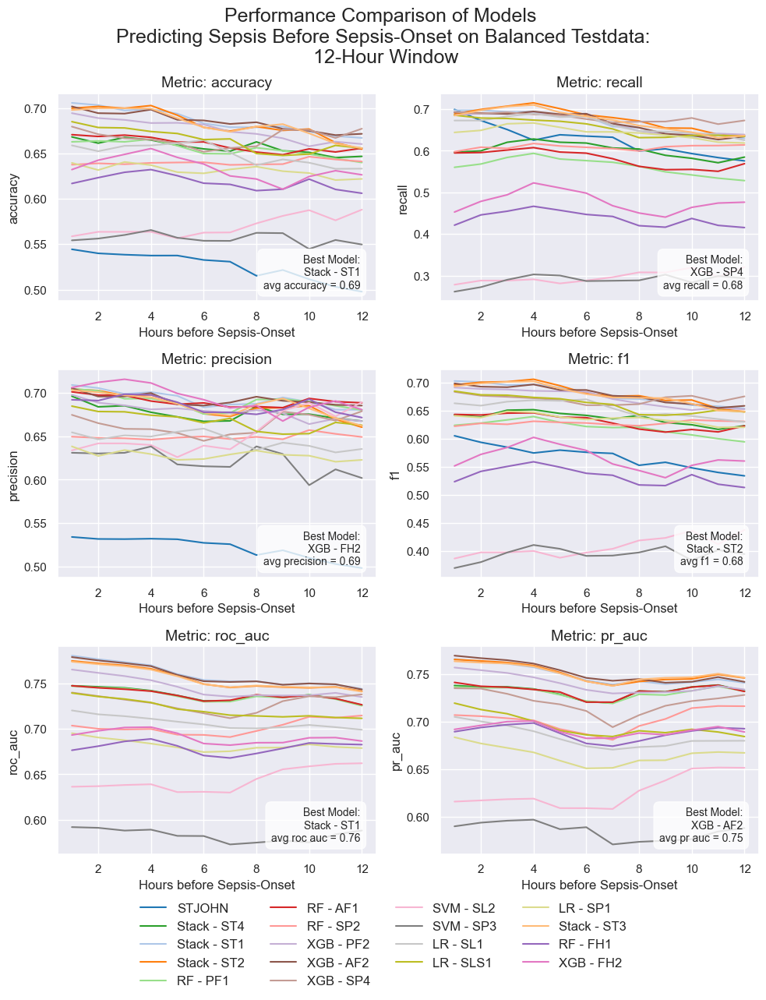

In [19]:
# Assuming `results_stjohn_icustay_bal` and `results_bal` are your data sources
stjon_data = pd.DataFrame(results_stjohn_icustay_bal)
ml_data = pd.DataFrame(results_bal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN")]

palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}

num_hours = 12
rows = 3
cols = 2
fig, axes = plt.subplots(rows, cols, figsize=(10, 12))
axes = axes.flatten()

plt.suptitle("Performance Comparison of Models \n Predicting Sepsis Before Sepsis-Onset on Balanced Testdata: \n 12-Hour Window", fontsize=18)

# Initialize a variable to store the handles and labels for the legend
handles, labels = None, None

for i, metric in enumerate(data.columns[-6:]):
    ax = axes[i]
    
    # Filter out 'stjohn' for 'roc_auc' and 'pr_auc' metrics
    if metric in ['roc_auc', 'pr_auc']:
        plot_data = data[data['model'] != 'STJOHN']
    else:
        plot_data = data

    sns_plot = sns.lineplot(
        data=plot_data,
        x="hour_before_so",
        y=metric,
        ax=ax,
        hue="model",
        legend='full' if i == 0 else False,
        palette=model_colors  # Use the fixed color mapping
    )
    ax.set_title(f"Metric: {metric}", fontsize=14)
    ax.set_xlabel("Hours before Sepsis-Onset")
    
    # Capture the handles and labels from the first subplot
    if i == 0:
        handles, labels = ax.get_legend_handles_labels()
        ax.get_legend().remove()  # Remove the legend from the first subplot
    
    # Calculate the average score over the 12-hour window for each model
    avg_scores = plot_data.groupby('model')[metric].mean()

    # Find the best model and its average score
    best_model = avg_scores.idxmax()
    best_avg_score = avg_scores.max()

    # Create the annotation text
    annotation_text = f"Best Model:\n{best_model}\navg {metric.replace('_', ' ')} = {best_avg_score:.2f}"
    
    # Annotate the best model and average score on the plot
    ax.text(0.95, 0.05, annotation_text,
            verticalalignment='bottom', 
            horizontalalignment='right',
            transform=ax.transAxes,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
            fontsize=10)

# Deactivate the last (empty) subplot
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adding the captured legend outside the plots
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.08), frameon=False)

# Adjust the layout to avoid overlap
plt.tight_layout(rect=[0, 0.02, 1, 1])

# Show the plot
plt.show()


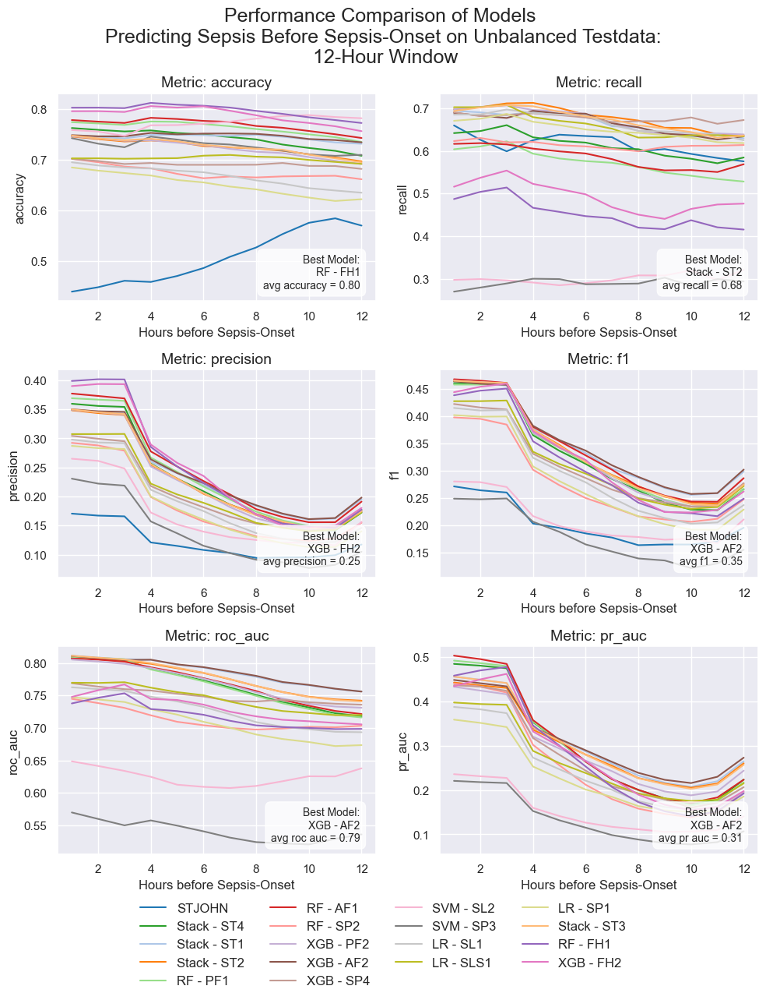

In [20]:
# Assuming `results_stjohn_icustay_unbal` and `results_unbal` are your data sources
stjon_data  = pd.DataFrame(results_stjohn_icustay_unbal)
ml_data     = pd.DataFrame(results_unbal)
data        = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN")]

palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}

num_hours = 12
rows = 3
cols = 2
fig, axes = plt.subplots(rows, cols, figsize=(10, 12))
axes = axes.flatten()

plt.suptitle("Performance Comparison of Models \n Predicting Sepsis Before Sepsis-Onset on Unbalanced Testdata: \n 12-Hour Window", fontsize=18)

# Initialize a variable to store the handles and labels for the legend
handles, labels = None, None

for i, metric in enumerate(data.columns[-6:]):
    ax = axes[i]
    
    # Filter out 'stjohn' for 'roc_auc' and 'pr_auc' metrics
    if metric in ['roc_auc', 'pr_auc']:
        plot_data = data[data['model'] != 'STJOHN']
    else:
        plot_data = data

    sns_plot = sns.lineplot(
        data=plot_data,
        x="hour_before_so",
        y=metric,
        ax=ax,
        hue="model",
        legend='full' if i == 0 else False,
        palette=model_colors  # Use the fixed color mapping
    )
    ax.set_title(f"Metric: {metric}", fontsize=14)
    ax.set_xlabel("Hours before Sepsis-Onset")
    
    # Capture the handles and labels from the first subplot
    if i == 0:
        handles, labels = ax.get_legend_handles_labels()
        ax.get_legend().remove()  # Remove the legend from the first subplot
    
    # Calculate the average score over the 12-hour window for each model
    avg_scores = plot_data.groupby('model')[metric].mean()

    # Find the best model and its average score
    best_model = avg_scores.idxmax()
    best_avg_score = avg_scores.max()

    # Create the annotation text
    annotation_text = f"Best Model:\n{best_model}\navg {metric.replace('_', ' ')} = {best_avg_score:.2f}"
    
    # Annotate the best model and average score on the plot
    ax.text(0.95, 0.05, annotation_text,
            verticalalignment='bottom', 
            horizontalalignment='right',
            transform=ax.transAxes,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
            fontsize=10)

# Deactivate the last (empty) subplot
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adding the captured legend outside the plots
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.08), frameon=False)

# Adjust the layout to avoid overlap
plt.tight_layout(rect=[0, 0.02, 1, 1])

# Show the plot
plt.show()

## F1-Scores

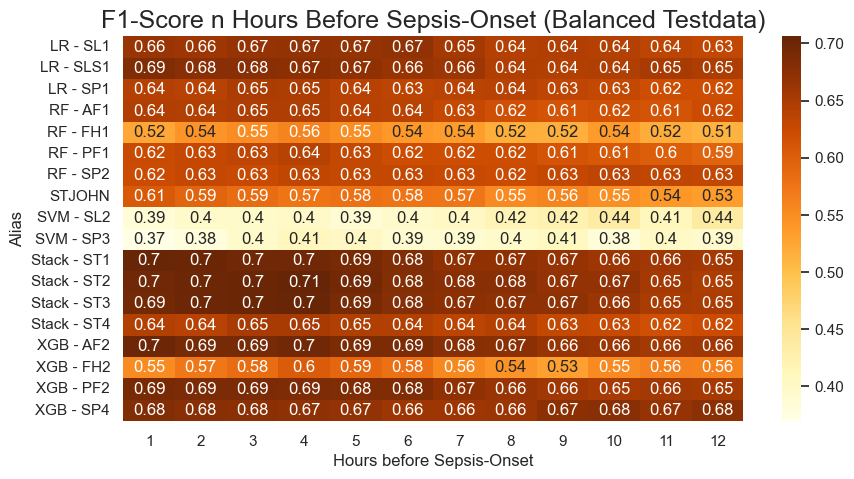

In [21]:
stjon_data = pd.DataFrame(results_stjohn_icustay_bal)
ml_data = pd.DataFrame(results_bal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN")]
test = data[["hour_before_so", "model", "f1"]].pivot_table(index=["model"], columns="hour_before_so", values="f1")

plt.figure(figsize=(10,5))
plt.title("F1-Score n Hours Before Sepsis-Onset (Balanced Testdata)", fontsize=18)
sns.heatmap(test, cmap="YlOrBr", annot=True)
plt.ylabel("Alias")
plt.xlabel("Hours before Sepsis-Onset")
plt.show()

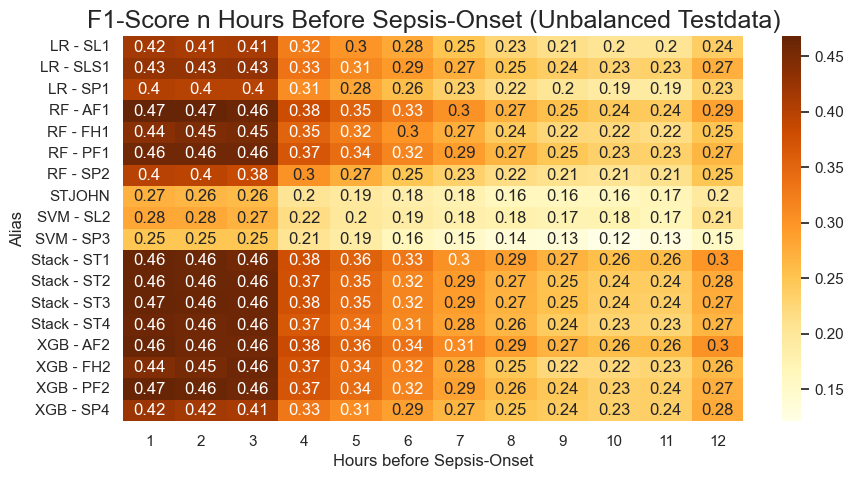

In [22]:
stjon_data = pd.DataFrame(results_stjohn_icustay_unbal)
ml_data = pd.DataFrame(results_unbal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN")]

test = data[["hour_before_so", "model", "f1"]].pivot_table(index=["model"], columns="hour_before_so", values="f1")

plt.figure(figsize=(10,5))
plt.title("F1-Score n Hours Before Sepsis-Onset (Unbalanced Testdata)", fontsize=18)
sns.heatmap(test, cmap="YlOrBr", annot=True)
plt.ylabel("Alias")
plt.xlabel("Hours before Sepsis-Onset")
plt.show()

## Precision Recall Balanced and Unbalanced Testdata

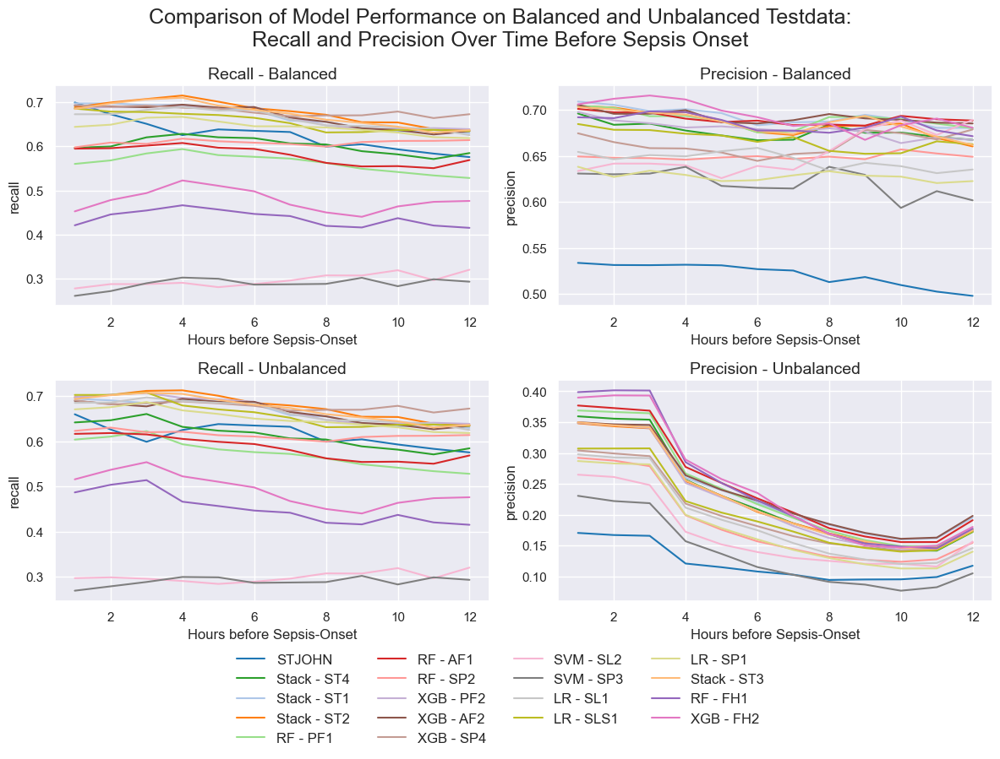

In [23]:
stjon_data_bal = pd.DataFrame(results_stjohn_icustay_bal)
ml_data_bal = pd.DataFrame(results_bal)
data_bal = pd.concat([stjon_data_bal, ml_data_bal])
data_bal["balance"] = "balanced"

stjon_data_unbal = pd.DataFrame(results_stjohn_icustay_unbal)
ml_data_unbal = pd.DataFrame(results_unbal)
data_unbal = pd.concat([stjon_data_unbal, ml_data_unbal])
data_unbal["balance"] = "unbalanced"
data = pd.concat([data_bal, data_unbal])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN")]

palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}
# Anzahl der Subplots ermitteln (doppelte Anzahl, da jeweils Recall und Precision geplottet werden)
num_plots = len(data["balance"].unique()) * 2
fig, ax = plt.subplots(num_plots // 2, 2, figsize=(12, num_plots * 2))
plt.suptitle("Comparison of Model Performance on Balanced and Unbalanced Testdata:\nRecall and Precision Over Time Before Sepsis Onset", fontsize=18)
# Flatten, falls ax eine 2D-Matrix ist
if num_plots > 2:
    ax = ax.flatten()

# Variable zur Speicherung der Handles und Labels für die Legende
handles, labels = None, None

# Durch jeden Balance-Zustand iterieren und die entsprechenden Plots erstellen
for i, bal in enumerate(data["balance"].unique()):
    temp = data[data["balance"] == bal]

    sns.lineplot(
        data=temp,
        x="hour_before_so",
        y="recall",
        hue="model",
        ax=ax[2 * i],
        palette=model_colors,
        legend='full' if i == 0 else False  # Legende nur für den ersten Plot aktivieren
    )
    ax[2 * i].set_title(f'Recall - {bal.capitalize()}', fontsize=14)
    ax[2 * i].set_xlabel("Hours before Sepsis-Onset")

    sns.lineplot(
        data=temp,
        x="hour_before_so",
        y="precision",
        hue="model",
        ax=ax[2 * i + 1],
        palette=model_colors,
        legend=False  # Legende deaktivieren
    )
    ax[2 * i + 1].set_title(f'Precision - {bal.capitalize()}', fontsize=14)
    ax[2 * i + 1].set_xlabel("Hours before Sepsis-Onset")
    
    # Handles und Labels von einem der Plots erfassen (nur einmal)
    if handles is None and labels is None:
        handles, labels = ax[2 * i].get_legend_handles_labels()
        # Legende entfernen, nachdem sie gespeichert wurde
        ax[2 * i].get_legend().remove()

# Layout anpassen, um Überlappungen zu vermeiden und Lesbarkeit zu verbessern
plt.subplots_adjust(bottom=0.2)  # Platz unten für die Legende reservieren
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.13), frameon=False)

# Adjust the layout to avoid overlap
plt.tight_layout(rect=[0, 0.02, 1, 1])

# Plot anzeigen
plt.show()


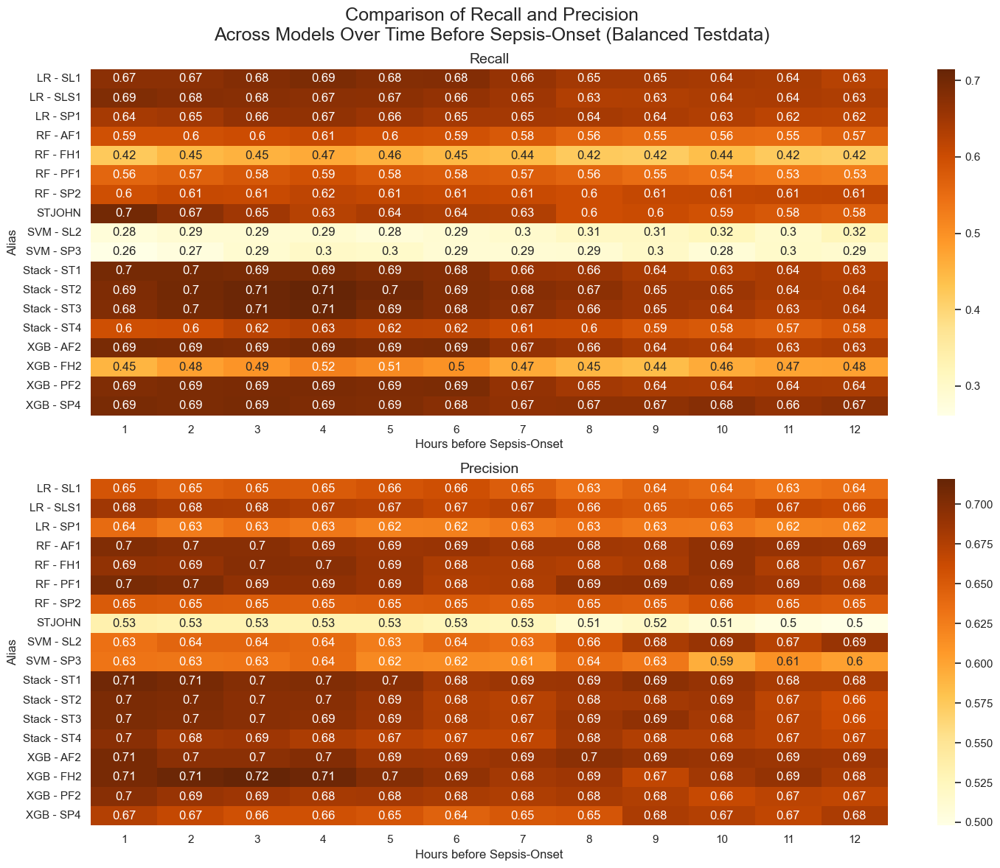

In [24]:
stjon_data = pd.DataFrame(results_stjohn_icustay_bal)
ml_data = pd.DataFrame(results_bal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN")]

fig, ax = plt.subplots(2, 1, figsize=(15, 12))
plt.suptitle("Comparison of Recall and Precision\nAcross Models Over Time Before Sepsis-Onset (Balanced Testdata)", fontsize=18, x=0.45)
sns.heatmap(data.pivot(columns="hour_before_so", index="model", values="recall"), annot=True, cmap="YlOrBr", ax=ax[0])
sns.heatmap(data.pivot(columns="hour_before_so", index="model", values="precision"), annot=True, cmap="YlOrBr", ax=ax[1])
ax[0].set_title("Recall", fontsize=14)
ax[0].set_xlabel("Hours before Sepsis-Onset")
ax[0].set_ylabel("Alias")
ax[1].set_title("Precision", fontsize=14)
ax[1].set_xlabel("Hours before Sepsis-Onset")
ax[1].set_ylabel("Alias")
plt.tight_layout(h_pad=1)


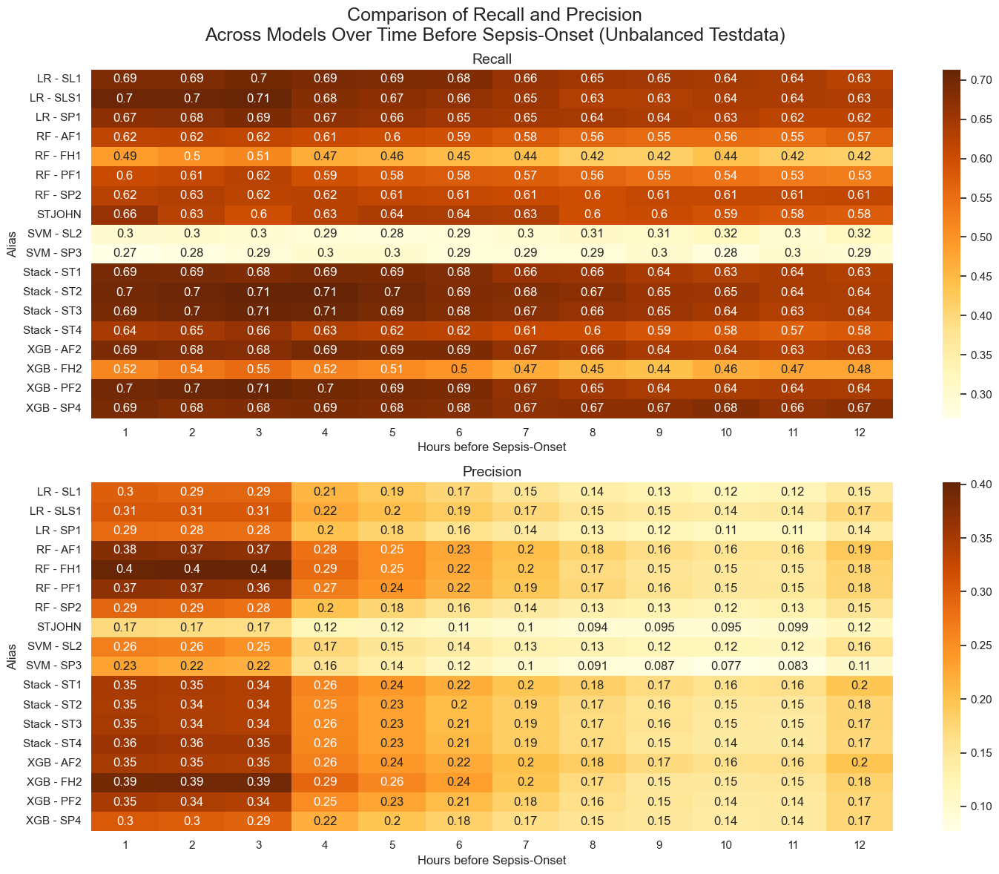

In [25]:
stjon_data = pd.DataFrame(results_stjohn_icustay_unbal)
ml_data = pd.DataFrame(results_unbal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN")]

fig, ax = plt.subplots(2, 1, figsize=(15, 12))
plt.suptitle("Comparison of Recall and Precision\nAcross Models Over Time Before Sepsis-Onset (Unbalanced Testdata)", fontsize=18, x=0.45)
sns.heatmap(data.pivot(columns="hour_before_so", index="model", values="recall"), annot=True, cmap="YlOrBr", ax=ax[0])
sns.heatmap(data.pivot(columns="hour_before_so", index="model", values="precision"), annot=True, cmap="YlOrBr", ax=ax[1])
ax[0].set_title("Recall", fontsize=14)
ax[0].set_xlabel("Hours before Sepsis-Onset")
ax[0].set_ylabel("Alias")
ax[1].set_title("Precision", fontsize=14)
ax[1].set_xlabel("Hours before Sepsis-Onset")
ax[1].set_ylabel("Alias")
plt.tight_layout(h_pad=1)


## Confusion Matrix 4h Before Sepsis-Onset

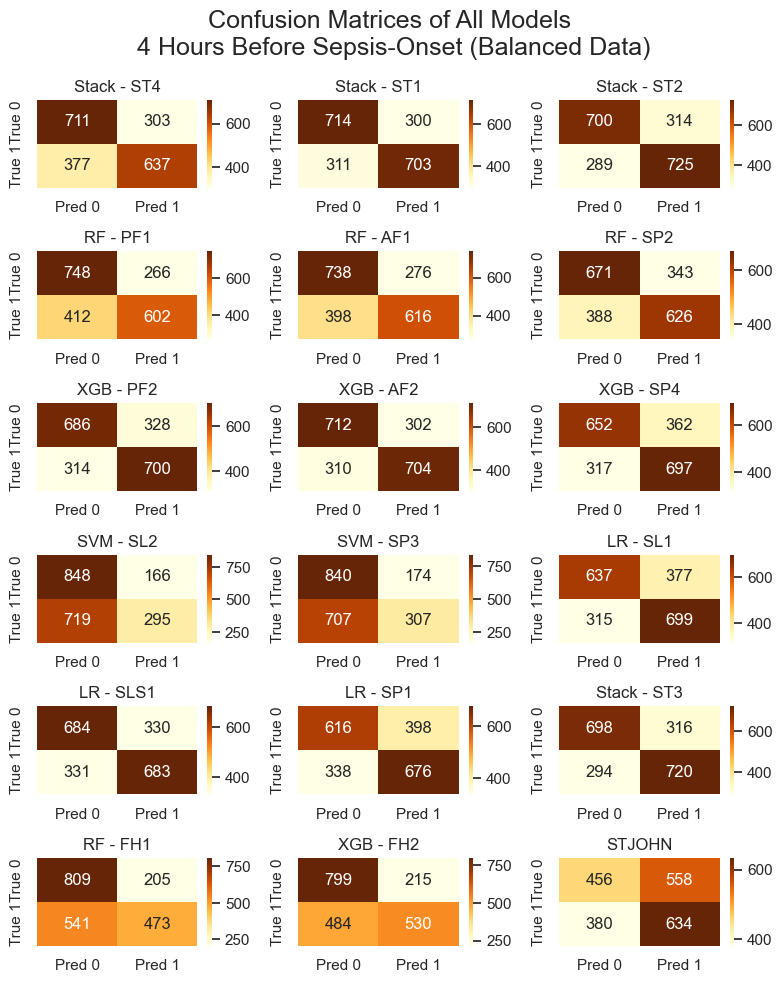

In [26]:
ml_data = pd.DataFrame(pred_bal)
stjohn_data = pd.DataFrame(pred_ml_stjohn_icustay_bal)
data = pd.concat([ml_data, stjohn_data])

data = data[(data["method"] == "icu_stay_wise") & (data["hour_before_so"] == 4)]

models = data["model"].unique()
ncols = 3
nrows = int(np.ceil(len(models) / ncols))

fig, ax = plt.subplots(nrows, ncols, figsize=(8, 10))
ax = ax.flatten()

for i, model in enumerate(models):
    temp    = data[data["model"] == model]
    temp    = temp.explode(column=["y_true", "y_pred"])
    y_true  = temp["y_true"].astype(int)
    y_pred  = temp["y_pred"].astype(int)
    cm      = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, ax=ax[i], annot=True, cmap="YlOrBr", fmt=".0f", xticklabels=['Pred 0', 'Pred 1'], yticklabels=['True 0', 'True 1'])
    ax[i].set_title(model)

# Füge einen Titel zur gesamten Abbildung hinzu
plt.suptitle("Confusion Matrices of All Models \n4 Hours Before Sepsis-Onset (Balanced Data)", fontsize=18)

plt.tight_layout(pad=1)
plt.subplots_adjust(top=0.89)  # Platz für den Supertitel schaffen
plt.show()

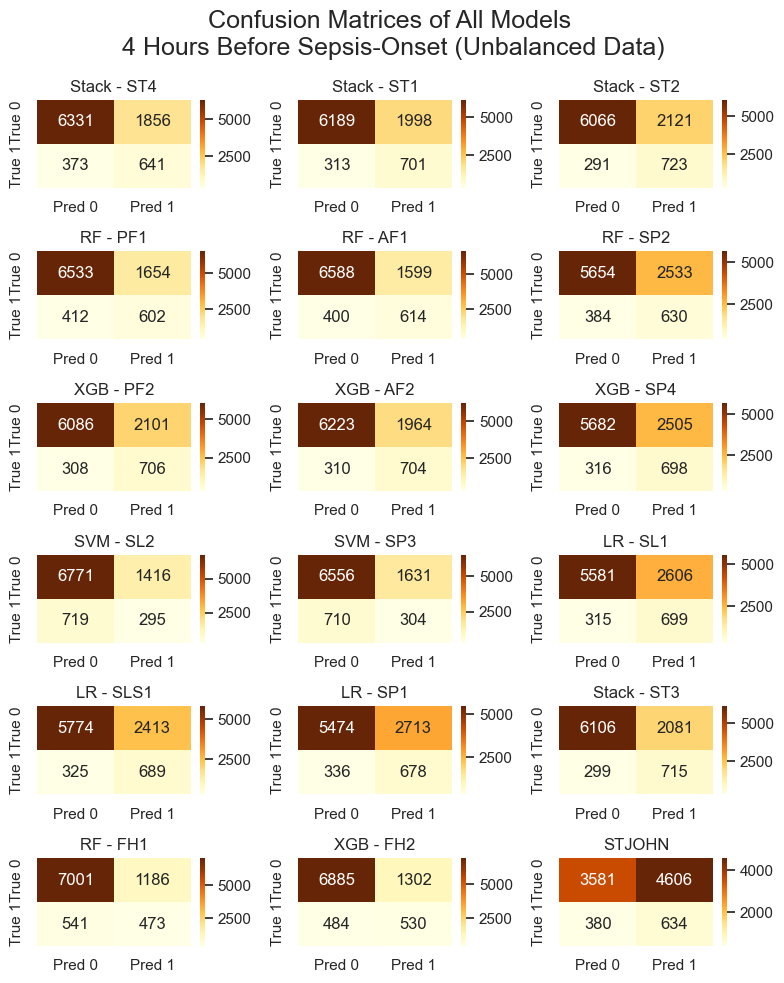

In [27]:
ml_data = pd.DataFrame(pred_unbal)
stjohn_data = pd.DataFrame(pred_ml_stjohn_icustay_unbal)
data = pd.concat([ml_data, stjohn_data])

data = data[(data["method"] == "icu_stay_wise") & (data["hour_before_so"] == 4)]

models = data["model"].unique()
ncols = 3
nrows = int(np.ceil(len(models) / ncols))

fig, ax = plt.subplots(nrows, ncols, figsize=(8, 10))
ax = ax.flatten()

for i, model in enumerate(models):
    temp    = data[data["model"] == model]
    temp    = temp.explode(column=["y_true", "y_pred"])
    y_true  = temp["y_true"].astype(int)
    y_pred  = temp["y_pred"].astype(int)
    cm      = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, ax=ax[i], annot=True, cmap="YlOrBr", fmt=".0f", xticklabels=['Pred 0', 'Pred 1'], yticklabels=['True 0', 'True 1'])
    ax[i].set_title(model)

# Füge einen Titel zur gesamten Abbildung hinzu
plt.suptitle("Confusion Matrices of All Models \n4 Hours Before Sepsis-Onset (Unbalanced Data)", fontsize=18)

plt.tight_layout(pad=1)
plt.subplots_adjust(top=0.89)  # Platz für den Supertitel schaffen
plt.show()

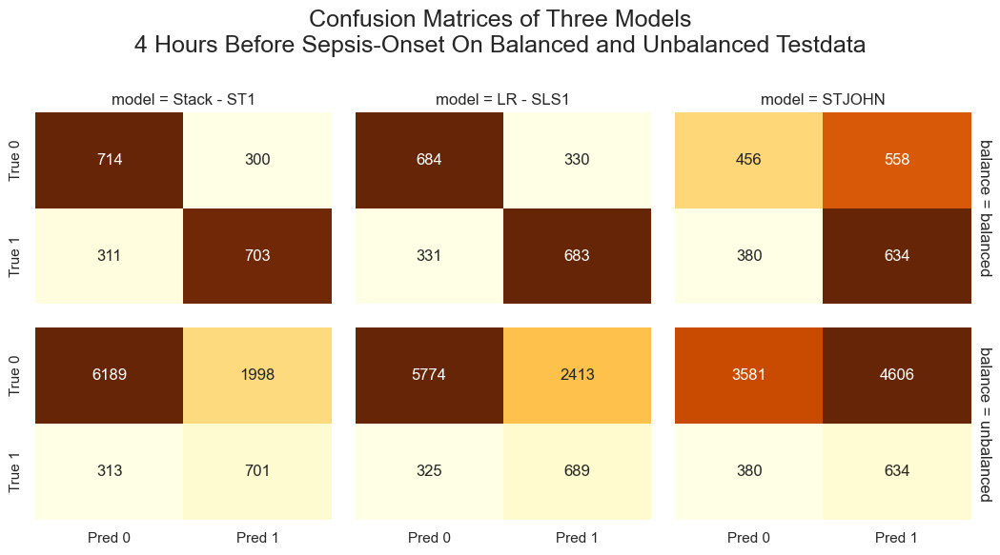

In [28]:
ml_data = pd.DataFrame(pred_bal)
stjohn_data = pd.DataFrame(pred_ml_stjohn_icustay_bal)
data_bal = pd.concat([ml_data, stjohn_data])
data_bal["balance"] = "balanced"

ml_data = pd.DataFrame(pred_unbal)
stjohn_data = pd.DataFrame(pred_ml_stjohn_icustay_unbal)
data_unbal = pd.concat([ml_data, stjohn_data])
data_unbal["balance"] = "unbalanced"

data = pd.concat([data_bal, data_unbal])
data = data.explode(column=["y_true", "y_pred"])
data = data[(data["method"] == "icu_stay_wise") & 
            (data["model"].str.contains("ST1|JOHN|SLS1")) &
            (data["hour_before_so"] == 4)]

def plot_heatmap(data, **kws):
    y_true = data['y_true'].astype(int)
    y_pred = data['y_pred'].astype(int)
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt="d", cmap="YlOrBr", cbar=False,
                xticklabels=['Pred 0', 'Pred 1'], yticklabels=['True 0', 'True 1'], **kws)

# Assuming `data` is your DataFrame
g = sns.FacetGrid(data=data, row="balance", col="model", margin_titles=True, height=3, aspect=1.2)
g.map_dataframe(plot_heatmap)
plt.suptitle("Confusion Matrices of Three Models\n4 Hours Before Sepsis-Onset On Balanced and Unbalanced Testdata", fontsize=18)


plt.tight_layout(pad=1.5)
plt.show()

## Mann-Whitney U-Test

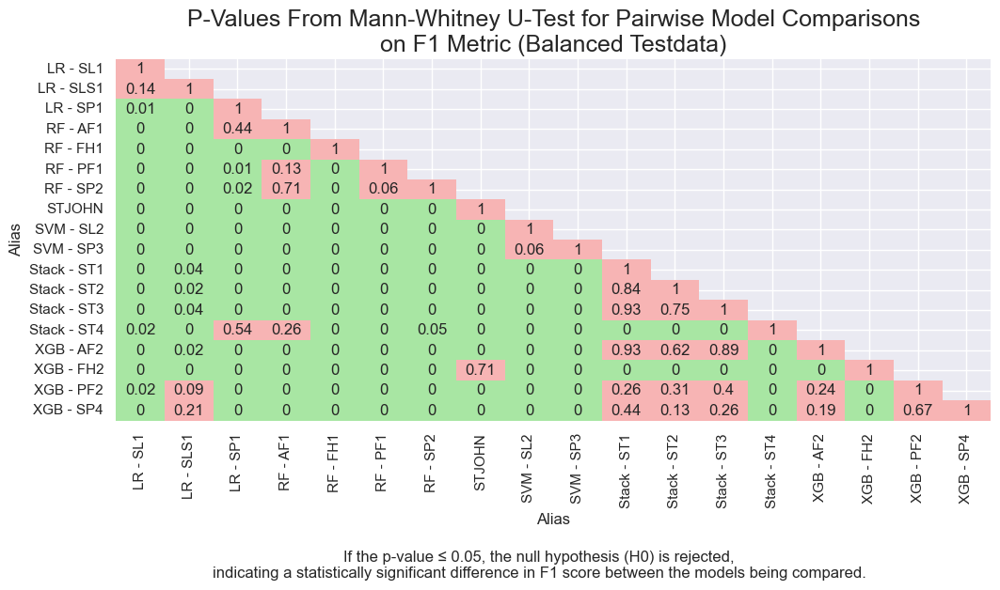

In [29]:
stjon_data = pd.DataFrame(results_stjohn_icustay_bal)
ml_data = pd.DataFrame(results_bal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN")]

results = {
    "model1": [],
    "model2": [],
    "stat": [],
    "p": []
}

metric = "f1"
models = data["model"].unique()
for i, model1 in enumerate(models):
    for model2 in models:
        model_1_scores = data[data["model"] == model1][metric]
        model_2_scores = data[data["model"] == model2][metric]
        stat, p = mannwhitneyu(model_1_scores, model_2_scores)
        results["model1"].append(model1)
        results["model2"].append(model2)
        results["stat"].append(stat)
        results["p"].append(p)

data = pd.DataFrame(results)
data = data.pivot(index="model1", columns="model2", values="p")
data = data.round(2)

# Set the upper triangle of the DataFrame to NaN
for i in range(len(data)):
    for j in range(i+1, len(data.columns)):
        data.iloc[i, j] = np.nan

# Softer color choices for better visual appeal
soft_green = '#a8e6a3'  # Light green for rejection
soft_red = '#f7b4b4'    # Light red for non-rejection
colors = [soft_red, soft_green]
threshold = 0.05
custom_cmap = ListedColormap([colors[0] if x > threshold else colors[1] for x in np.linspace(0, 1, 256)])

# Plot heatmap with the custom color map
plt.figure(figsize=(12, 5))
sns.heatmap(data, annot=True, cmap=custom_cmap, cbar=False, mask=data.isnull())

plt.xlabel("Alias")
plt.ylabel("Alias")

# Add a meaningful title
plt.title("P-Values From Mann-Whitney U-Test for Pairwise Model Comparisons\non F1 Metric (Balanced Testdata)", fontsize=18)

# Add text below the heatmap
plt.figtext(0.5, -0.22, "If the p-value ≤ 0.05, the null hypothesis (H0) is rejected,\nindicating a statistically significant difference in F1 score between the models being compared.", wrap=True, horizontalalignment='center', fontsize=12)

plt.show()

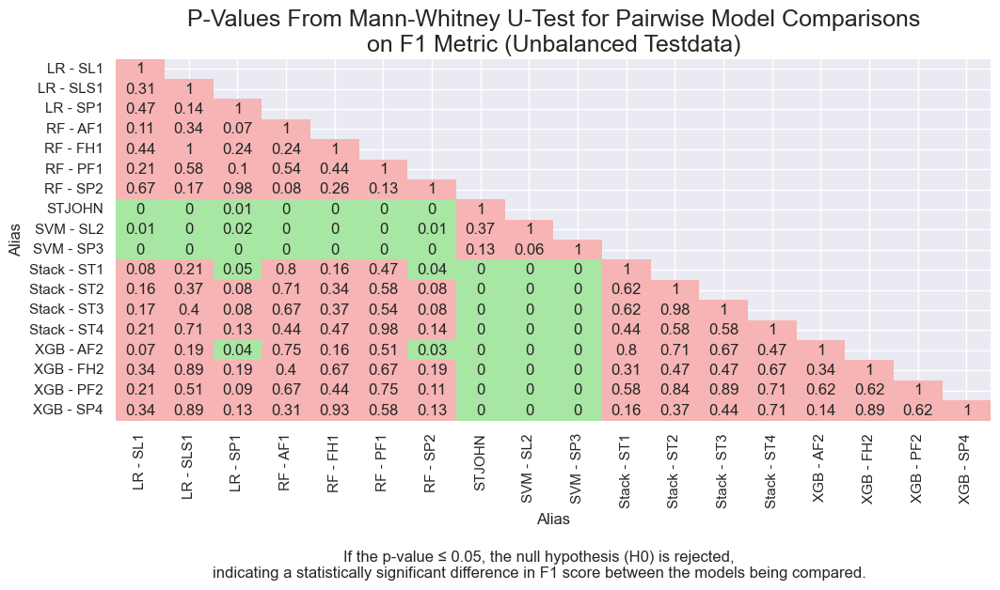

In [30]:
stjon_data = pd.DataFrame(results_stjohn_icustay_unbal)
ml_data = pd.DataFrame(results_unbal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN")]

results = {
    "model1": [],
    "model2": [],
    "stat": [],
    "p": []
}

metric = "f1"
models = data["model"].unique()
for model1 in models:
    for model2 in models:
        model_1_scores = data[data["model"] == model1][metric]
        model_2_scores = data[data["model"] == model2][metric]
        stat, p = mannwhitneyu(model_1_scores, model_2_scores)
        results["model1"].append(model1)
        results["model2"].append(model2)
        results["stat"].append(stat)
        results["p"].append(p)

data = pd.DataFrame(results)
data = data.pivot(index="model1", columns="model2", values="p")
data = data.round(2)

# Set the upper triangle of the DataFrame to NaN
for i in range(len(data)):
    for j in range(i+1, len(data.columns)):
        data.iloc[i, j] = np.nan

# Softer color choices for better visual appeal
soft_green = '#a8e6a3'  # Light green for rejection
soft_red = '#f7b4b4'    # Light red for non-rejection
colors = [soft_red, soft_green]
threshold = 0.05
custom_cmap = ListedColormap([colors[0] if x > threshold else colors[1] for x in np.linspace(0, 1, 256)])

# Plot heatmap with the custom color map
plt.figure(figsize=(12, 5))
sns.heatmap(data, annot=True, cmap=custom_cmap, cbar=False, mask=data.isnull())

plt.xlabel("Alias")
plt.ylabel("Alias")

# Add a meaningful title
plt.title("P-Values From Mann-Whitney U-Test for Pairwise Model Comparisons\non F1 Metric (Unbalanced Testdata)", fontsize=18)

# Add text below the heatmap
plt.figtext(0.5, -0.22, "If the p-value ≤ 0.05, the null hypothesis (H0) is rejected,\nindicating a statistically significant difference in F1 score between the models being compared.", wrap=True, horizontalalignment='center', fontsize=12)

plt.show()

## Kappa Coefficient

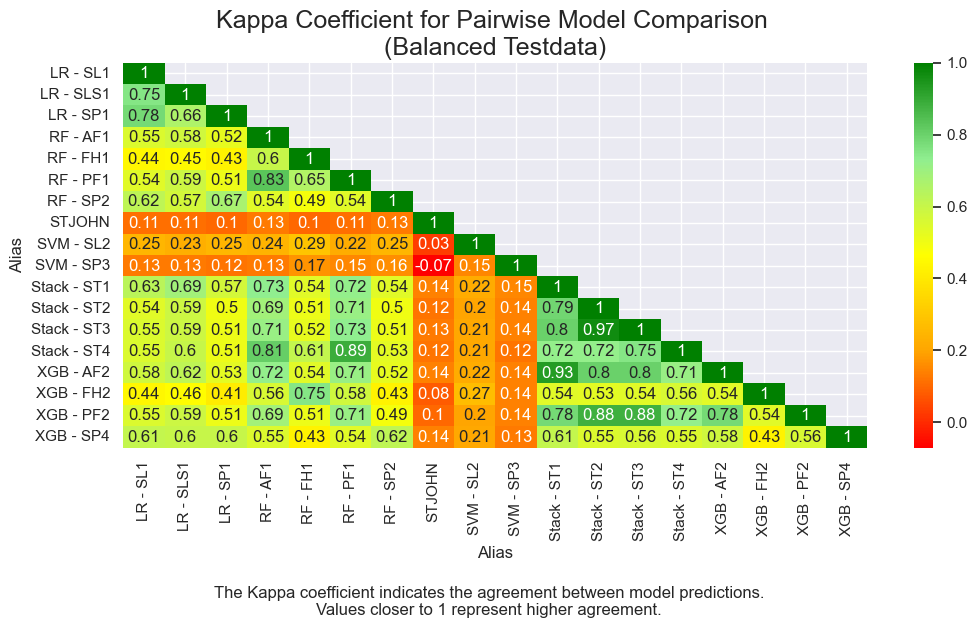

In [31]:
df_pred_ml = pd.DataFrame(pred_bal)
df_pred_stjoh = pd.DataFrame(pred_ml_stjohn_icustay_bal)
df_pred = pd.concat([df_pred_ml, df_pred_stjoh])
df_pred = df_pred[df_pred["method"] == "icu_stay_wise"]
df_pred = df_pred.explode(column=["y_true", "y_pred"])

models = df_pred["model"].unique()

results = {
    "model1": [],
    "model2": [],
    "k": []
}


for model1 in models:
    for model2 in models:  
        
        model_1_pred = df_pred[df_pred["model"] == model1]["y_pred"].astype(int).values
        model_2_pred = df_pred[df_pred["model"] == model2]["y_pred"].astype(int).values

        k = cohen_kappa_score(model_1_pred, model_2_pred)

        results["model1"].append(model1)
        results["model2"].append(model2)
        results["k"].append(k)

data = pd.DataFrame(results)
data = data.pivot(index="model1", columns="model2", values="k")
data = data.round(2)

for i in range(len(data)):
    for j in range(i+1, len(data.columns)):
        data.iloc[i, j] = np.nan


cmap_colors = ['#FF0000', '#FFA500', '#FFFF00', '#90EE90', '#008000']

cmap = LinearSegmentedColormap.from_list("custom_cmap", cmap_colors)

bounds = [0, 0.20, 0.40, 0.60, 0.80, 1.00]

plt.figure(figsize=(12, 5))
sns.heatmap(data, annot=True, cbar=True, mask=data.isnull(), cmap=cmap)

plt.xlabel("Alias")
plt.ylabel("Alias")

plt.title("Kappa Coefficient for Pairwise Model Comparison \n(Balanced Testdata)", fontsize=18)

plt.figtext(0.43, -0.22, "The Kappa coefficient indicates the agreement between model predictions.\nValues closer to 1 represent higher agreement.", wrap=True, horizontalalignment='center', fontsize=12)

plt.show()

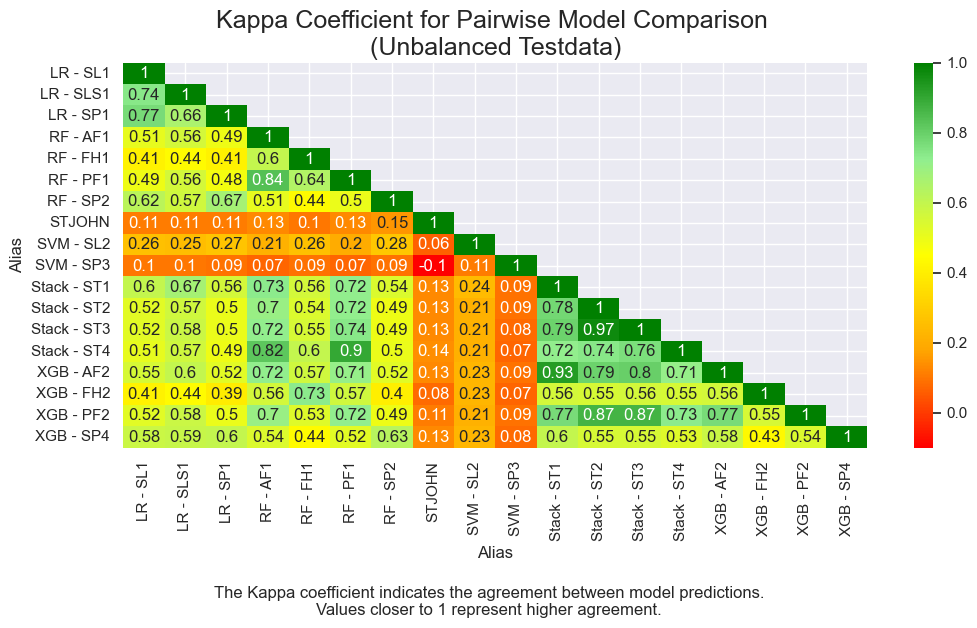

In [32]:
df_pred_ml = pd.DataFrame(pred_unbal)
df_pred_stjoh = pd.DataFrame(pred_ml_stjohn_icustay_unbal)
df_pred = pd.concat([df_pred_ml, df_pred_stjoh])
df_pred = df_pred[df_pred["method"] == "icu_stay_wise"]
df_pred = df_pred.explode(column=["y_true", "y_pred"])


# Einzigartige Modelle
models = df_pred["model"].unique()

results = {
    "model1": [],
    "model2": [],
    "k": []
}


for model1 in models:
    for model2 in models:  
        
        model_1_pred = df_pred[df_pred["model"] == model1]["y_pred"].astype(int).values
        model_2_pred = df_pred[df_pred["model"] == model2]["y_pred"].astype(int).values

        k = cohen_kappa_score(model_1_pred, model_2_pred)

        results["model1"].append(model1)
        results["model2"].append(model2)
        results["k"].append(k)

data = pd.DataFrame(results)
data = data.pivot(index="model1", columns="model2", values="k")
data = data.round(2)

for i in range(len(data)):
    for j in range(i+1, len(data.columns)):
        data.iloc[i, j] = np.nan


cmap_colors = ['#FF0000', '#FFA500', '#FFFF00', '#90EE90', '#008000']

cmap = LinearSegmentedColormap.from_list("custom_cmap", cmap_colors)

bounds = [0, 0.20, 0.40, 0.60, 0.80, 1.00]

plt.figure(figsize=(12, 5))
sns.heatmap(data, annot=True, cbar=True, mask=data.isnull(), cmap=cmap)

plt.xlabel("Alias")
plt.ylabel("Alias")

plt.title("Kappa Coefficient for Pairwise Model Comparison \n(Unbalanced Testdata)", fontsize=18)

plt.figtext(0.43, -0.22, "The Kappa coefficient indicates the agreement between model predictions.\nValues closer to 1 represent higher agreement.", wrap=True, horizontalalignment='center', fontsize=12)

plt.show()

## FPR and FNR

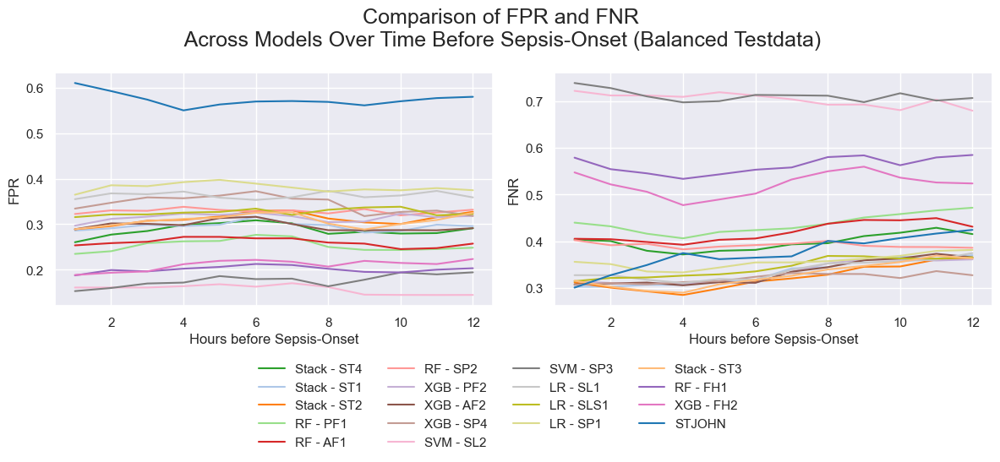

In [33]:
df_pred_ml = pd.DataFrame(pred_bal)
df_pred_stjoh = pd.DataFrame(pred_ml_stjohn_icustay_bal)
df_pred = pd.concat([df_pred_ml, df_pred_stjoh])
df_pred = df_pred[df_pred["method"] == "icu_stay_wise"]
df_pred = df_pred.explode(column=["y_true", "y_pred"])

tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

results = {
    "model":[],
    "hour_before_so":[],
    "fpr":[],
    "fnr":[]
}

for model in df_pred["model"].unique():
    for hour in df_pred["hour_before_so"].unique():
        temp = df_pred[(df_pred["model"] == model) &
                       (df_pred["hour_before_so"] == hour)]
        y_true = temp["y_true"].astype(int)
        y_pred = temp["y_pred"].astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
        results["model"].append(model)
        results["hour_before_so"].append(hour)
        fpr = fp / (fp + tn)
        fnr = fn / (fn + tp)
        results["fpr"].append(fpr)
        results["fnr"].append(fnr)

data = pd.DataFrame(results)

model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}

fig, ax = plt.subplots(1, 2, figsize=(12, 4.5))
plt.suptitle("Comparison of FPR and FNR\n Across Models Over Time Before Sepsis-Onset (Balanced Testdata)", fontsize=18)
sns.lineplot(data=data, x="hour_before_so", y="fpr", hue="model", ax=ax[0], palette=model_colors)
sns.lineplot(data=data, x="hour_before_so", y="fnr", hue="model", ax=ax[1], palette=model_colors)

handles, labels = ax[0].get_legend_handles_labels()
legend  = fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.21), ncol=4)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_edgecolor('white')

ax[0].set_ylabel("FPR")
ax[0].set_xlabel("Hours before Sepsis-Onset")
ax[0].get_legend().remove()

ax[1].set_ylabel("FNR")
ax[1].set_xlabel("Hours before Sepsis-Onset")
ax[1].get_legend().remove()

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.show()

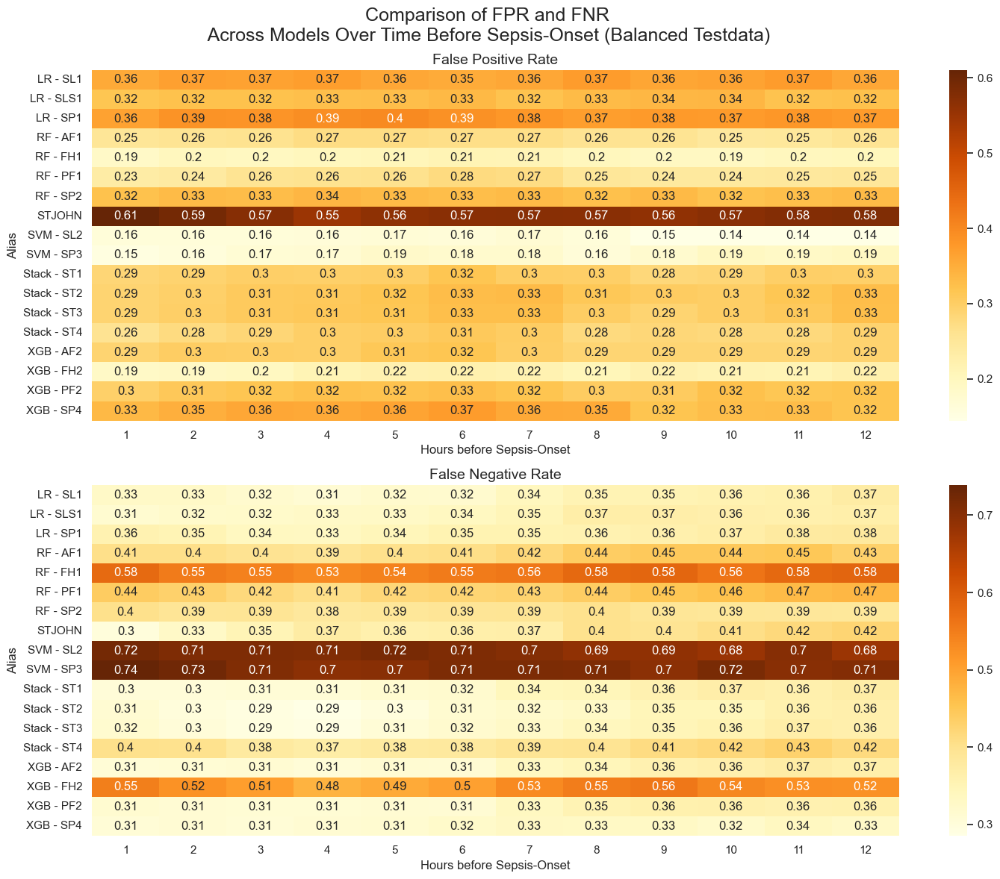

In [34]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
plt.suptitle("Comparison of FPR and FNR\n Across Models Over Time Before Sepsis-Onset (Balanced Testdata)", fontsize=18, x=0.44)
sns.heatmap(data.pivot(columns="hour_before_so", index="model", values="fpr"), annot=True, cmap="YlOrBr", ax=ax[0])
sns.heatmap(data.pivot(columns="hour_before_so", index="model", values="fnr"), annot=True, cmap="YlOrBr", ax=ax[1])
ax[0].set_title("False Positive Rate", fontsize=14)
ax[0].set_xlabel("Hours before Sepsis-Onset")
ax[0].set_ylabel("Alias")
ax[1].set_title("False Negative Rate", fontsize=14)
ax[1].set_xlabel("Hours before Sepsis-Onset")
ax[1].set_ylabel("Alias")
plt.tight_layout(h_pad=1)

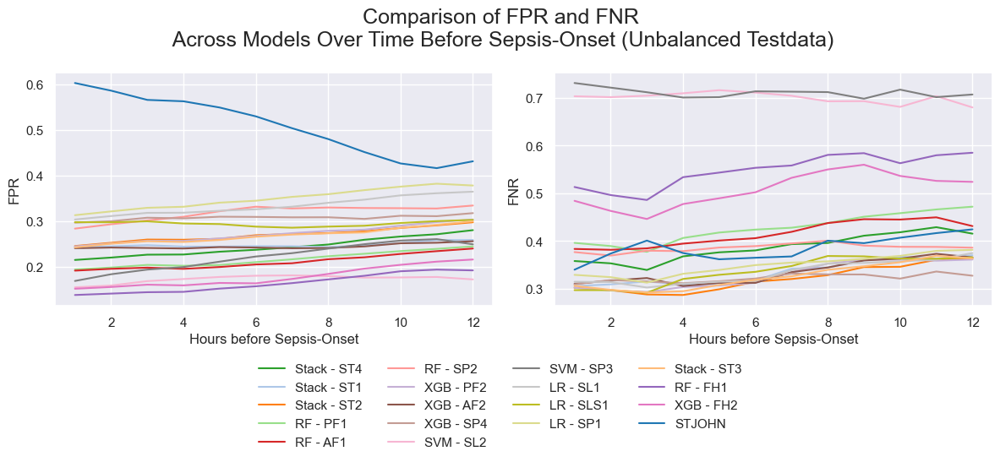

In [35]:
df_pred_ml = pd.DataFrame(pred_unbal)
df_pred_stjoh = pd.DataFrame(pred_ml_stjohn_icustay_unbal)
df_pred = pd.concat([df_pred_ml, df_pred_stjoh])
df_pred = df_pred[df_pred["method"] == "icu_stay_wise"]
df_pred = df_pred.explode(column=["y_true", "y_pred"])

tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

results = {
    "model":[],
    "hour_before_so":[],
    "fpr":[],
    "fnr":[]
}

for model in df_pred["model"].unique():
    for hour in df_pred["hour_before_so"].unique():
        temp = df_pred[(df_pred["model"] == model) &
                       (df_pred["hour_before_so"] == hour)]
        y_true = temp["y_true"].astype(int)
        y_pred = temp["y_pred"].astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
        results["model"].append(model)
        results["hour_before_so"].append(hour)
        fpr = fp / (fp + tn)
        fnr = fn / (fn + tp)
        results["fpr"].append(fpr)
        results["fnr"].append(fnr)

data = pd.DataFrame(results)

model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}

fig, ax = plt.subplots(1, 2, figsize=(12, 4.5))
plt.suptitle("Comparison of FPR and FNR\n Across Models Over Time Before Sepsis-Onset (Unbalanced Testdata)", fontsize=18)
sns.lineplot(data=data, x="hour_before_so", y="fpr", hue="model", ax=ax[0], palette=model_colors)
sns.lineplot(data=data, x="hour_before_so", y="fnr", hue="model", ax=ax[1], palette=model_colors)

handles, labels = ax[0].get_legend_handles_labels()
legend  = fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.21), ncol=4)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_edgecolor('white')

ax[0].set_ylabel("FPR")
ax[0].set_xlabel("Hours before Sepsis-Onset")
ax[0].get_legend().remove()

ax[1].set_ylabel("FNR")
ax[1].set_xlabel("Hours before Sepsis-Onset")
ax[1].get_legend().remove()

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.show()

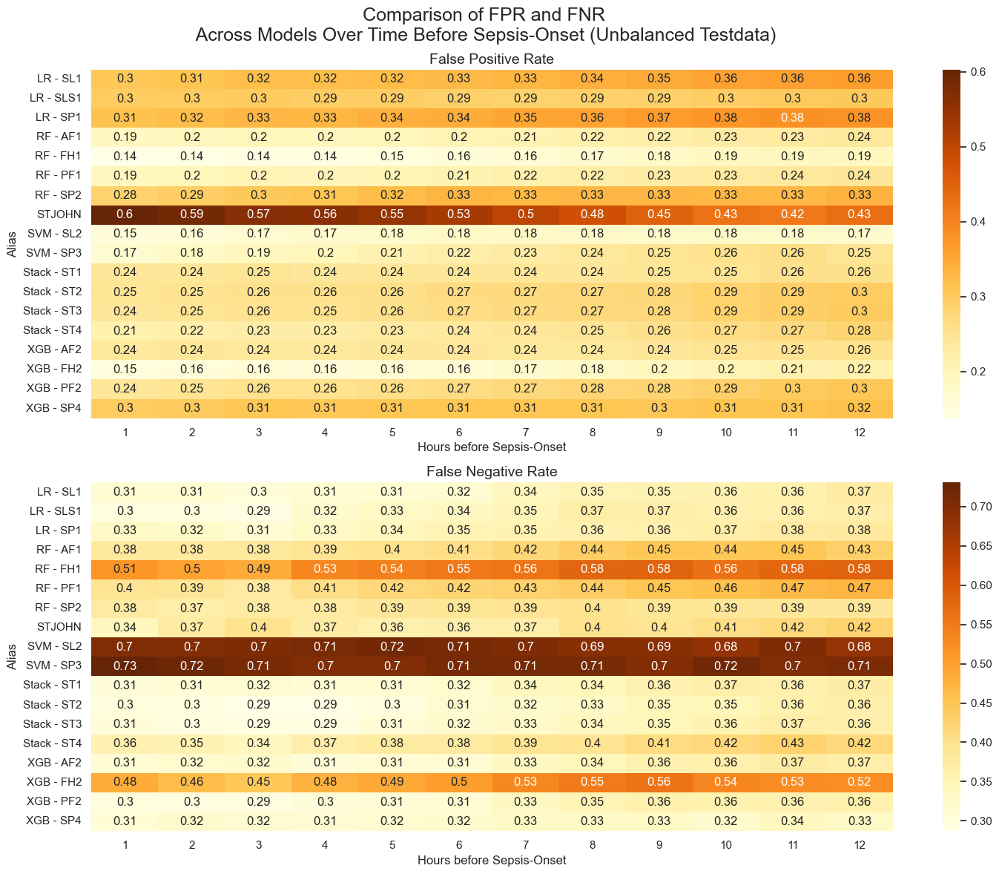

In [36]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
plt.suptitle("Comparison of FPR and FNR\n Across Models Over Time Before Sepsis-Onset (Unbalanced Testdata)", fontsize=18, x=0.44)
sns.heatmap(data.pivot(columns="hour_before_so", index="model", values="fpr"), annot=True, cmap="YlOrBr", ax=ax[0])
sns.heatmap(data.pivot(columns="hour_before_so", index="model", values="fnr"), annot=True, cmap="YlOrBr", ax=ax[1])
ax[0].set_title("False Positive Rate", fontsize=14)
ax[0].set_xlabel("Hours before Sepsis-Onset")
ax[0].set_ylabel("Alias")
ax[1].set_title("False Negative Rate", fontsize=14)
ax[1].set_xlabel("Hours before Sepsis-Onset")
ax[1].set_ylabel("Alias")
plt.tight_layout(h_pad=1)

## ROC-Curve and AUC

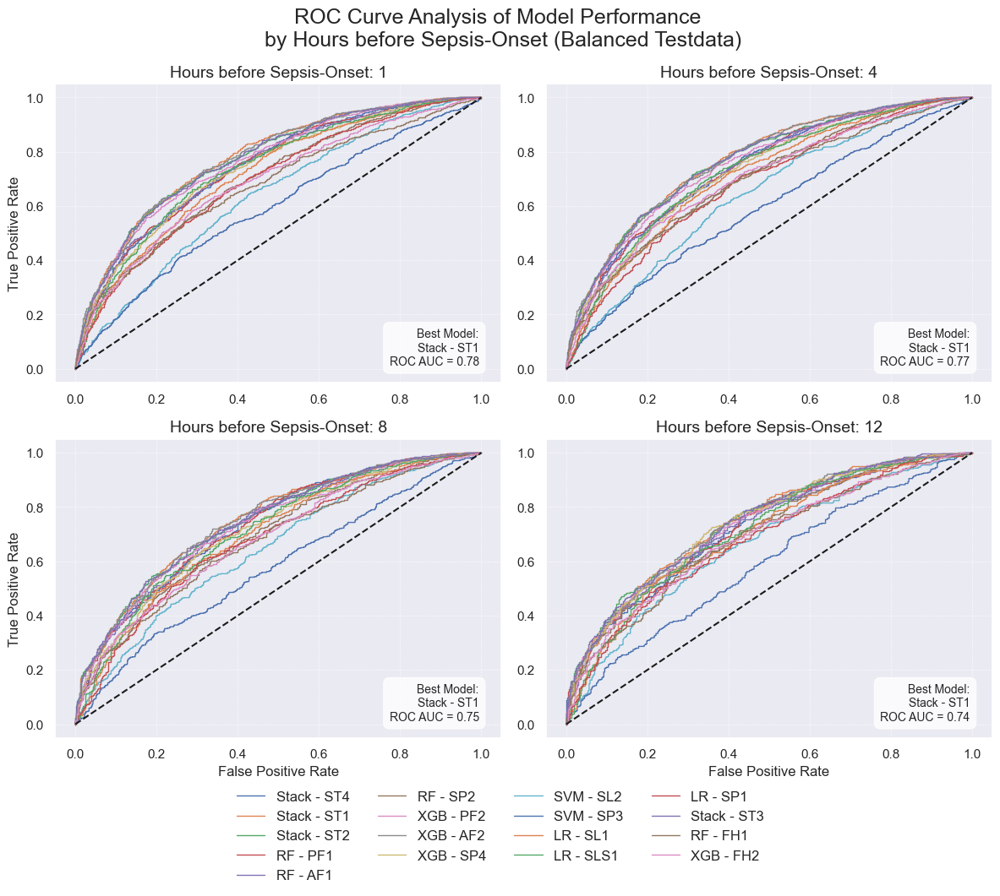

In [37]:
palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],
    "Stack - ST2": palette[2],
    "Stack - ST3": palette[3],
    "Stack - ST4": palette[4],
    "RF - PF1": palette[5],
    "RF - AF1": palette[6],
    "RF - SP2": palette[7],
    "RF - FH1": palette[8],
    "XGB - PF2": palette[9],
    "XGB - AF2": palette[10],
    "XGB - SP4": palette[11],
    "XGB - FH2": palette[12],
    "SVM - SL2": palette[13],
    "SVM - SP3": palette[14],
    "LR - SL1": palette[15],
    "LR - SLS1": palette[16],
    "LR - SP1": palette[17],
}

num_hours = 4
rows = 2
cols = 2
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))
axes = axes.flatten()

plt.suptitle("ROC Curve Analysis of Model Performance \n by Hours before Sepsis-Onset (Balanced Testdata)", fontsize=18)

i = 0 
for (hour, keys_dict) in curves_ml_bal["icu_stay_wise"].items():
    best_auc = 0  # Initialize the best AUC value for this hour
    best_model = ''  # Model name with the best AUC value
    if hour in [1, 4, 8, 12]:
        for k, (key, model) in enumerate(keys_dict.items()):
            tpr = model["tpr"]
            fpr = model["fpr"]
            auc_value = model["roc_auc"] 

            if auc_value > best_auc:
                best_auc = auc_value
                best_model = key

            # Plot the ROC curve without AUC in the legend
            axes[i].plot(fpr, tpr, label=key, linewidth=1)

        # Plot the diagonal line
        axes[i].plot([0, 1], [0, 1], 'k--', linewidth=1.5)

        # Add the best AUC value as an annotation in a box
        annotation_text = f"Best Model:\n{best_model}\nROC AUC = {best_auc:.2f}"
        axes[i].text(0.95, 0.05, annotation_text,
                    verticalalignment='bottom', horizontalalignment='right',
                    transform=axes[i].transAxes,
                    bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                    fontsize=10)

        # Add titles back to each subplot
        axes[i].set_title(f"Hours before Sepsis-Onset: {hour}", fontsize=14)

        # Format only the outer axes with labels
        if i % cols == 0:  # Leftmost column
            axes[i].set_ylabel('True Positive Rate', fontsize=12)
        if i >= len(axes) - cols:  # Bottom row
            axes[i].set_xlabel('False Positive Rate', fontsize=12)

        axes[i].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

        i += 1

# Adjust the spacing between subplots
plt.tight_layout(rect=[0, 0.05, 1, 1])

# Adding a legend below the plots with padding
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.07), frameon=False)

plt.subplots_adjust(top=0.89) 
# Show the plot
plt.show()


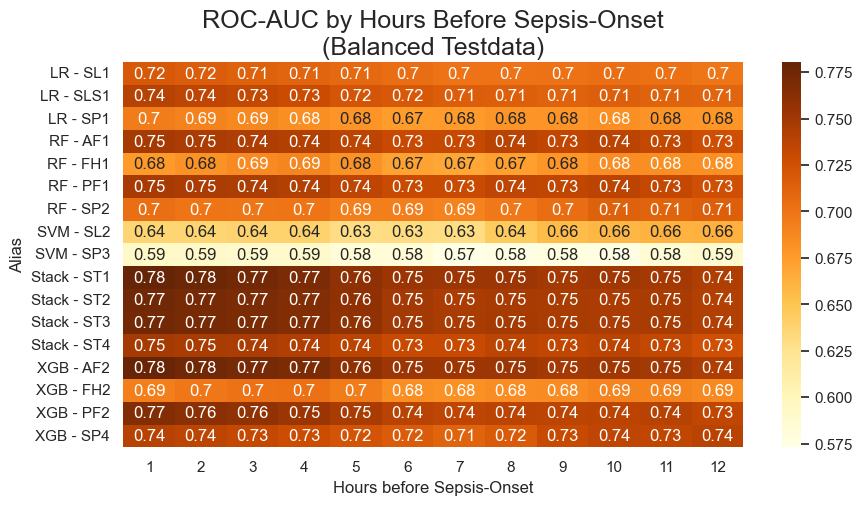

In [38]:
# Assuming `results_stjohn_icustay_bal` and `results_bal` are your data sources
stjon_data = pd.DataFrame(results_stjohn_icustay_bal)
ml_data = pd.DataFrame(results_bal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["model"] != "STJOHN") & (data["method"] == "icu_stay_wise")] 
data = data[["model", "hour_before_so", "roc_auc"]]
data = data.pivot_table(columns="hour_before_so", index="model", values="roc_auc")

plt.figure(figsize=(10,5))
sns.heatmap(data, annot=True, cmap="YlOrBr")
plt.title("ROC-AUC by Hours Before Sepsis-Onset\n(Balanced Testdata)", fontsize=18)
plt.ylabel("Alias")
plt.xlabel("Hours before Sepsis-Onset")
plt.show()

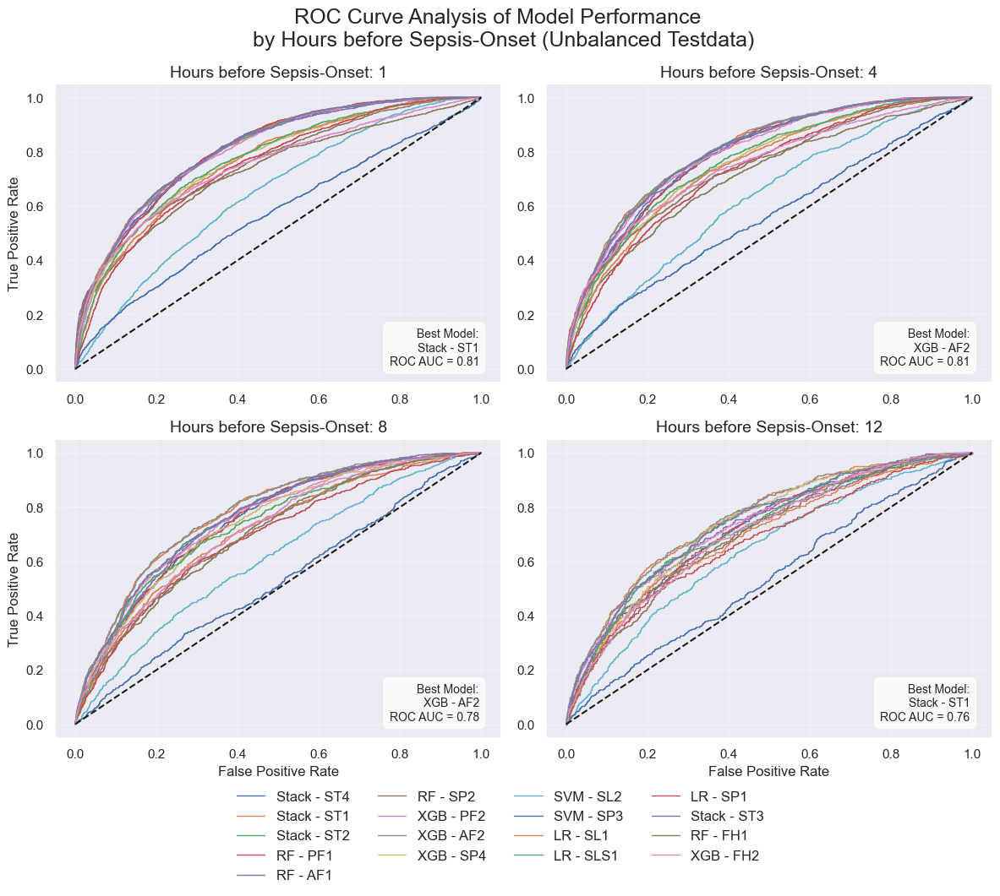

In [39]:
palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],
    "Stack - ST2": palette[2],
    "Stack - ST3": palette[3],
    "Stack - ST4": palette[4],
    "RF - PF1": palette[5],
    "RF - AF1": palette[6],
    "RF - SP2": palette[7],
    "RF - FH1": palette[8],
    "XGB - PF2": palette[9],
    "XGB - AF2": palette[10],
    "XGB - SP4": palette[11],
    "XGB - FH2": palette[12],
    "SVM - SL2": palette[13],
    "SVM - SP3": palette[14],
    "LR - SL1": palette[15],
    "LR - SLS1": palette[16],
    "LR - SP1": palette[17],
}

num_hours = 4
rows = 2
cols = 2
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))
axes = axes.flatten()

plt.suptitle("ROC Curve Analysis of Model Performance \n by Hours before Sepsis-Onset (Unbalanced Testdata)", fontsize=18)

i = 0 
for (hour, keys_dict) in curves_ml_unbal["icu_stay_wise"].items():
    best_auc = 0  # Initialize the best AUC value for this hour
    best_model = ''  # Model name with the best AUC value
    if hour in [1, 4, 8, 12]:
        for k, (key, model) in enumerate(keys_dict.items()):
            tpr = model["tpr"]
            fpr = model["fpr"]
            auc_value = model["roc_auc"] 

            if auc_value > best_auc:
                best_auc = auc_value
                best_model = key

            # Plot the ROC curve without AUC in the legend
            axes[i].plot(fpr, tpr, label=key, linewidth=1)

        # Plot the diagonal line
        axes[i].plot([0, 1], [0, 1], 'k--', linewidth=1.5)

        # Add the best AUC value as an annotation in a box
        annotation_text = f"Best Model:\n{best_model}\nROC AUC = {best_auc:.2f}"
        axes[i].text(0.95, 0.05, annotation_text,
                    verticalalignment='bottom', horizontalalignment='right',
                    transform=axes[i].transAxes,
                    bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                    fontsize=10)

        # Add titles back to each subplot
        axes[i].set_title(f"Hours before Sepsis-Onset: {hour}", fontsize=14)

        # Format only the outer axes with labels
        if i % cols == 0:  # Leftmost column
            axes[i].set_ylabel('True Positive Rate', fontsize=12)
        if i >= len(axes) - cols:  # Bottom row
            axes[i].set_xlabel('False Positive Rate', fontsize=12)

        axes[i].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

        i += 1

# Adjust the spacing between subplots
plt.tight_layout(rect=[0, 0.05, 1, 1])

# Adding a legend below the plots with padding
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.07), frameon=False)

plt.subplots_adjust(top=0.89) 
# Show the plot
plt.show()


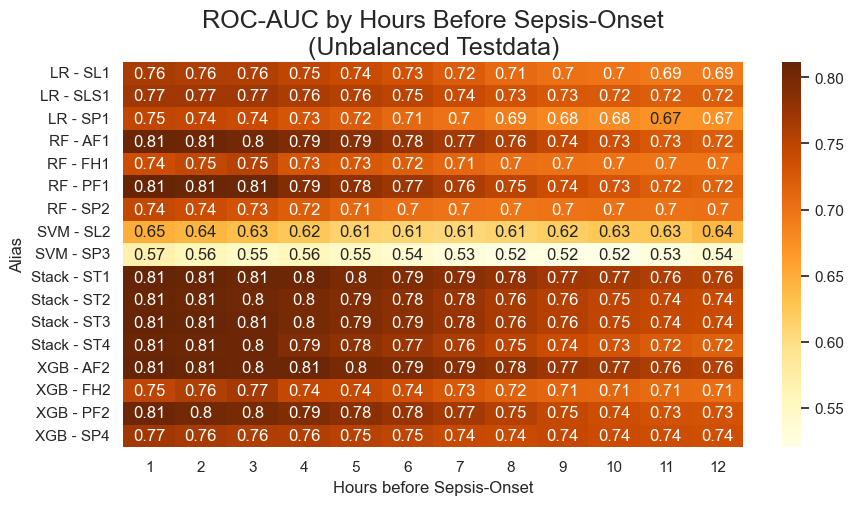

In [40]:
# Assuming `results_stjohn_icustay_bal` and `results_bal` are your data sources
stjon_data = pd.DataFrame(results_stjohn_icustay_unbal)
ml_data = pd.DataFrame(results_unbal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["model"] != "STJOHN") & (data["method"] == "icu_stay_wise")] 
data = data[["model", "hour_before_so", "roc_auc"]]
data = data.pivot_table(columns="hour_before_so", index="model", values="roc_auc")

plt.figure(figsize=(10,5))
sns.heatmap(data, annot=True, cmap="YlOrBr")
plt.title("ROC-AUC by Hours Before Sepsis-Onset\n(Unbalanced Testdata)", fontsize=18)
plt.ylabel("Alias")
plt.xlabel("Hours before Sepsis-Onset")
plt.show()

## PR-Curve and AUC

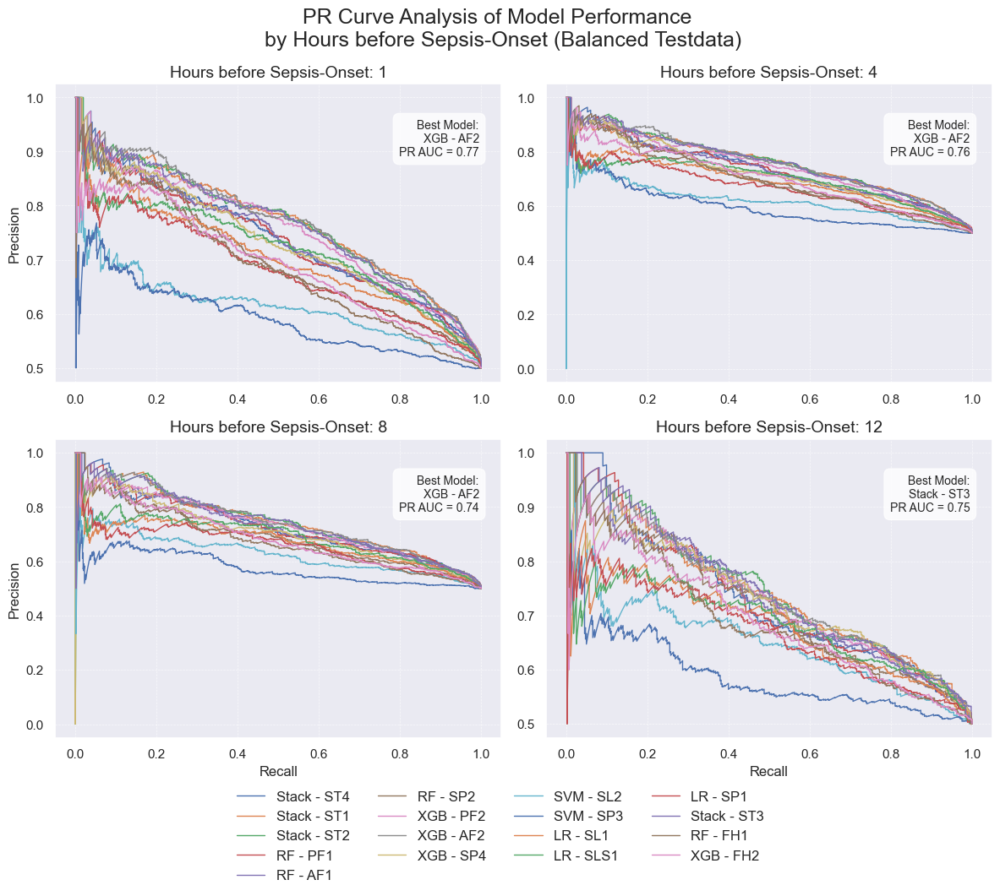

In [41]:
palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}

num_hours = 4
rows = 2
cols = 2
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))
axes = axes.flatten()

plt.suptitle("PR Curve Analysis of Model Performance \n by Hours before Sepsis-Onset (Balanced Testdata)", fontsize=18)
i = 0
for (hour, keys_dict) in (curves_ml_bal["icu_stay_wise"].items()):
    best_auc = 0  # Initialize the best PR AUC value for this hour
    best_model = ''  # Model name with the best PR AUC value

    if hour in [1,4,8,12]:
        for k, (key, model) in enumerate(keys_dict.items()):
            precision = model["precision"]
            recall = model["recall"]
            pr_auc = model["pr_auc"]  # Assuming pr_auc is already in the data

            if pr_auc > best_auc:
                best_auc = pr_auc
                best_model = key

            # Plot the PR curve without AUC in the legend
            axes[i].plot(recall, precision, label=key, linewidth=1)

        # Add the best PR AUC value as an annotation in a box
        annotation_text = f"Best Model:\n{best_model}\nPR AUC = {best_auc:.2f}"
        axes[i].text(0.95, 0.75, annotation_text,
                    verticalalignment='bottom', horizontalalignment='right',
                    transform=axes[i].transAxes,
                    bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                    fontsize=10)

        # Add titles back to each subplot
        axes[i].set_title(f"Hours before Sepsis-Onset: {hour}", fontsize=14)

        # Format only the outer axes with labels
        if i % cols == 0:  # Leftmost column
            axes[i].set_ylabel('Precision', fontsize=12)
        if i >= len(axes) - cols:  # Bottom row
            axes[i].set_xlabel('Recall', fontsize=12)

        axes[i].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
        i += 1
# Adjust the spacing between subplots
plt.tight_layout(rect=[0, 0.05, 1, 1])

# Adding a legend below the plots with padding
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.07), frameon=False)

plt.subplots_adjust(top=0.89) 
# Show the plot
plt.show()

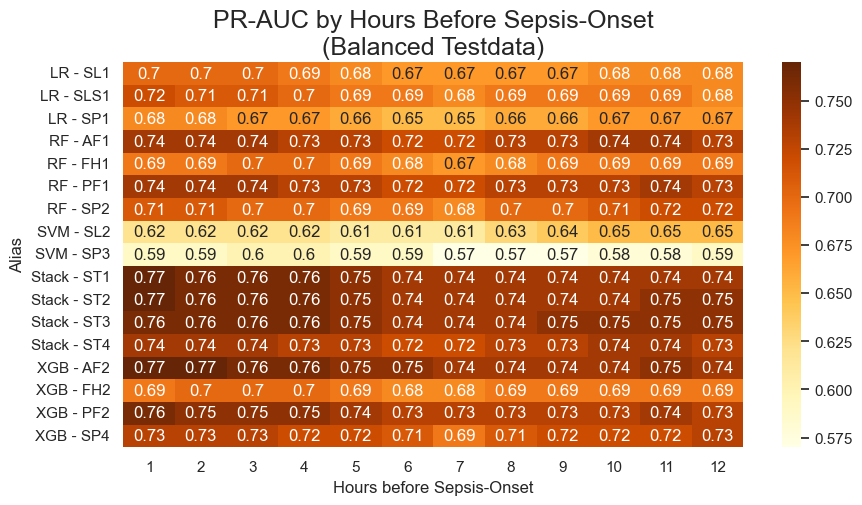

In [42]:
# Assuming `results_stjohn_icustay_bal` and `results_bal` are your data sources
stjon_data = pd.DataFrame(results_stjohn_icustay_bal)
ml_data = pd.DataFrame(results_bal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["model"] != "STJOHN") & (data["method"] == "icu_stay_wise")] 
data = data[["model", "hour_before_so", "pr_auc"]]
data = data.pivot_table(columns="hour_before_so", index="model", values="pr_auc")
data = data.round(2)
plt.figure(figsize=(10,5))
sns.heatmap(data, annot=True, cmap="YlOrBr")
plt.title("PR-AUC by Hours Before Sepsis-Onset\n(Balanced Testdata)", fontsize=18)
plt.ylabel("Alias")
plt.xlabel("Hours before Sepsis-Onset")
plt.show()

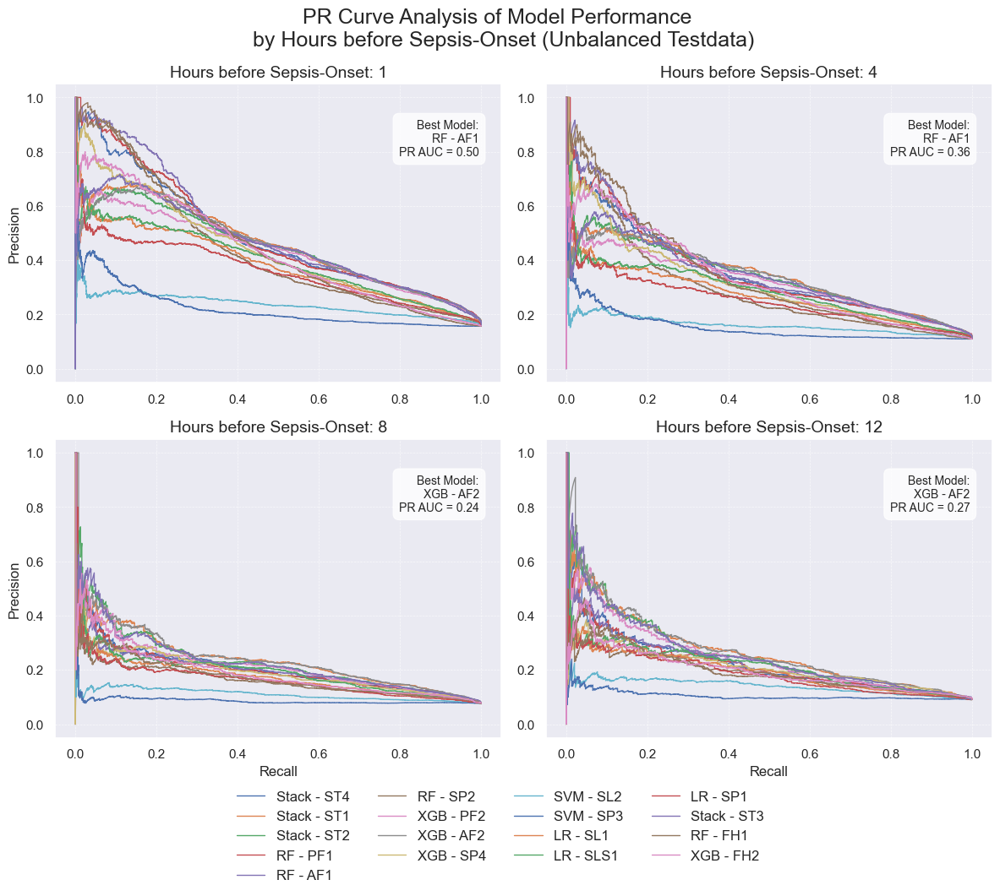

In [43]:
palette = sns.color_palette("tab20", n_colors=18)

# Assign the colours to the models
model_colors = {
    "STJOHN": palette[0],
    "Stack - ST1": palette[1],  # StackedXGB_LR.joblib
    "Stack - ST2": palette[2],  # StackedXGB.joblib
    "Stack - ST3": palette[3],  # StackedRF_XGB.joblib
    "Stack - ST4": palette[4],  # StackedRF.joblib
    "RF - PF1": palette[5],  # RandomForest_presel.joblib
    "RF - AF1": palette[6],  # RandomForest_all.joblib
    "RF - SP2": palette[7],  # RandomForest_pca.joblib
    "RF - FH1": palette[8],  # RandomForest_first_hour.joblib
    "XGB - PF2": palette[9],  # XGBClassifier_presel.joblib
    "XGB - AF2": palette[10],  # XGBClassifier_all.joblib
    "XGB - SP4": palette[11],  # XGBClassifier_pca.joblib
    "XGB - FH2": palette[12],  # XGBClassifier_first_hour.joblib
    "SVM - SL2": palette[13],  # SVM_lasso_alpha_fix.joblib
    "SVM - SP3": palette[14],  # SVM_pca.joblib
    "LR - SL1": palette[15],  # LogisticRegression_lasso_alpha_fix.joblib
    "LR - SLS1": palette[16],  # LogisticRegression_lasso_alpha_search.joblib
    "LR - SP1": palette[17],  # LogisticRegression_pca.joblib
}

num_hours = 4
rows = 2
cols = 2
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))
axes = axes.flatten()

plt.suptitle("PR Curve Analysis of Model Performance \n by Hours before Sepsis-Onset (Unbalanced Testdata)", fontsize=18)
i = 0
for (hour, keys_dict) in (curves_ml_unbal["icu_stay_wise"].items()):
    best_auc = 0  # Initialize the best PR AUC value for this hour
    best_model = ''  # Model name with the best PR AUC value

    if hour in [1,4,8,12]:
        for k, (key, model) in enumerate(keys_dict.items()):
            precision = model["precision"]
            recall = model["recall"]
            pr_auc = model["pr_auc"]  # Assuming pr_auc is already in the data

            if pr_auc > best_auc:
                best_auc = pr_auc
                best_model = key

            # Plot the PR curve without AUC in the legend
            axes[i].plot(recall, precision, label=key, linewidth=1)

        # Add the best PR AUC value as an annotation in a box
        annotation_text = f"Best Model:\n{best_model}\nPR AUC = {best_auc:.2f}"
        axes[i].text(0.95, 0.75, annotation_text,
                    verticalalignment='bottom', horizontalalignment='right',
                    transform=axes[i].transAxes,
                    bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
                    fontsize=10)

        # Add titles back to each subplot
        axes[i].set_title(f"Hours before Sepsis-Onset: {hour}", fontsize=14)

        # Format only the outer axes with labels
        if i % cols == 0:  # Leftmost column
            axes[i].set_ylabel('Precision', fontsize=12)
        if i >= len(axes) - cols:  # Bottom row
            axes[i].set_xlabel('Recall', fontsize=12)

        axes[i].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
        i += 1
# Adjust the spacing between subplots
plt.tight_layout(rect=[0, 0.05, 1, 1])

# Adding a legend below the plots with padding
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=12, ncol=4, bbox_to_anchor=(0.5, -0.07), frameon=False)

plt.subplots_adjust(top=0.89) 
# Show the plot
plt.show()

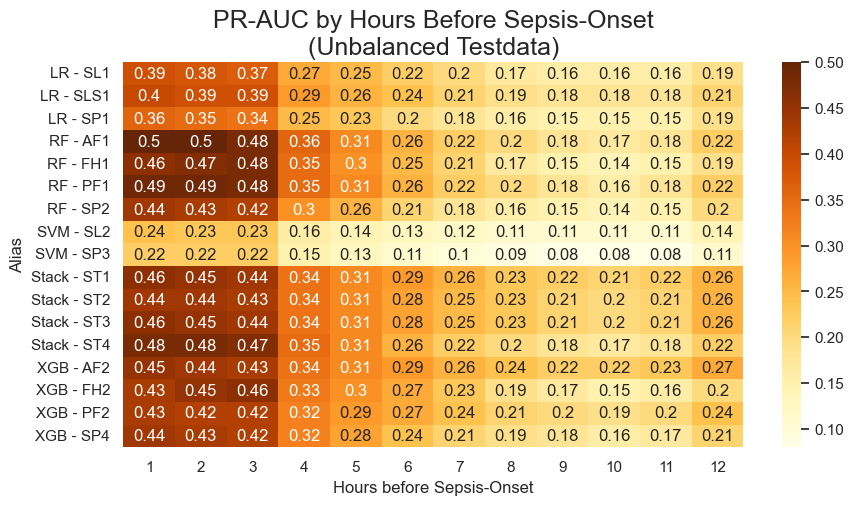

In [44]:
# Assuming `results_stjohn_icustay_bal` and `results_bal` are your data sources
stjon_data = pd.DataFrame(results_stjohn_icustay_unbal)
ml_data = pd.DataFrame(results_unbal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["model"] != "STJOHN") & (data["method"] == "icu_stay_wise")] 
data = data[["model", "hour_before_so", "pr_auc"]]
data = data.pivot_table(columns="hour_before_so", index="model", values="pr_auc")
data = data.round(2)
plt.figure(figsize=(10,5))
sns.heatmap(data, annot=True, cmap="YlOrBr")
plt.title("PR-AUC by Hours Before Sepsis-Onset\n(Unbalanced Testdata)", fontsize=18)
plt.ylabel("Alias")
plt.xlabel("Hours before Sepsis-Onset")
plt.show()

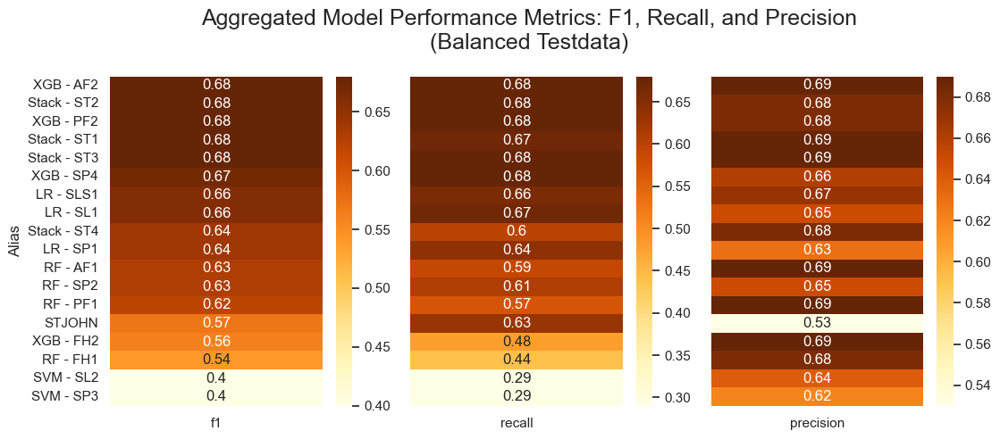

In [45]:
stjon_data = pd.DataFrame(results_stjohn_icustay_bal)
ml_data = pd.DataFrame(results_bal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN") ] 
data = data.groupby(["model"])[data.iloc[:,4:7].columns].median().sort_values(by="f1", ascending=False).round(2)
data = data[["f1", "recall", "precision"]]
# Plotting heatmap with individual colorbars for each metric
fig, axs = plt.subplots(1, 3, figsize=(12, 5))

metrics = ['f1', 'recall', 'precision']
cmaps = ['YlOrBr', 'YlOrBr', 'YlOrBr']

# Create a list to store the heatmaps
heatmaps = []
plt.suptitle("Aggregated Model Performance Metrics: F1, Recall, and Precision\n(Balanced Testdata)", fontsize=18)
for ax, metric, cmap in zip(axs, metrics, cmaps):
    heatmap = sns.heatmap(data[[metric]], annot=True, cmap=cmap, cbar=True, 
                          ax=ax, vmin=data[metric].min(), vmax=data[metric].max(), yticklabels=True if ax == axs[0] else False)
    heatmap.set_ylabel("Alias" if ax == axs[0] else "")
    heatmap.set_xlabel("")
    heatmaps.append(heatmap)

# Set colorbar only for the last heatmap and position it to the right
plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()

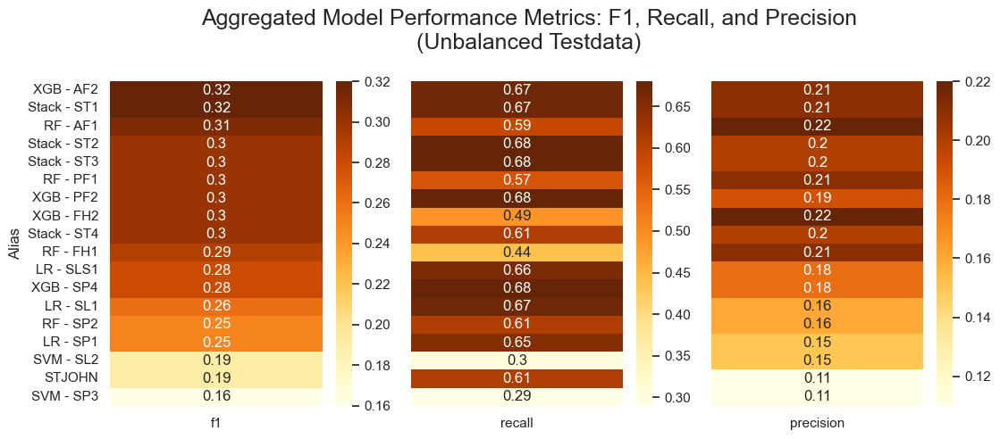

In [46]:
stjon_data = pd.DataFrame(results_stjohn_icustay_unbal)
ml_data = pd.DataFrame(results_unbal)
data = pd.concat([stjon_data, ml_data])
data = data[(data["method"] == "icu_stay_wise") | (data["model"] == "STJOHN") ] 
data = data.groupby(["model"])[data.iloc[:,4:7].columns].median().sort_values(by="f1", ascending=False).round(2)
data = data[["f1", "recall", "precision"]]
# Plotting heatmap with individual colorbars for each metric
fig, axs = plt.subplots(1, 3, figsize=(12, 5))

metrics = ['f1', 'recall', 'precision']
cmaps = ['YlOrBr', 'YlOrBr', 'YlOrBr']

# Create a list to store the heatmaps
heatmaps = []
plt.suptitle("Aggregated Model Performance Metrics: F1, Recall, and Precision\n(Unbalanced Testdata)", fontsize=18)
for ax, metric, cmap in zip(axs, metrics, cmaps):
    heatmap = sns.heatmap(data[[metric]], annot=True, cmap=cmap, cbar=True, 
                          ax=ax, vmin=data[metric].min(), vmax=data[metric].max(), yticklabels=True if ax == axs[0] else False)
    heatmap.set_ylabel("Alias" if ax == axs[0] else "")
    heatmap.set_xlabel("")
    heatmaps.append(heatmap)

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()